In [1]:
# Mapping between Sound & Word labels
# using RNN-LSTM
# TensorFlow 1.0.1 w/ Python 3.5
# 2017-04-08
#
# Input: Sound frames (26 dimensional MFCC+delta input); e.g. 'ta', 'da' utterances
# Output: Phone labels (4 categories: t, d, a, sil)
#
# **Prerequisite**
# - Install 'python_speech_features' package
#   from https://github.com/jameslyons/python_speech_features
# - Install 'textgrid' package
#   from https://github.com/kylebgorman/textgrid

from pylab import*
from scipy.io import wavfile
from python_speech_features import mfcc
from python_speech_features import delta
from python_speech_features import logfbank
import textgrid
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

srate (Hz): 44100
duration (sec): 11.122335600907029


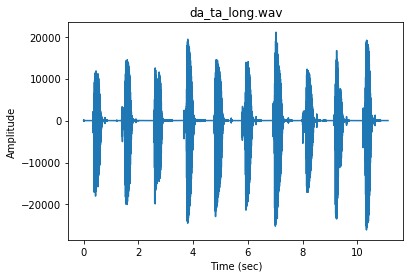

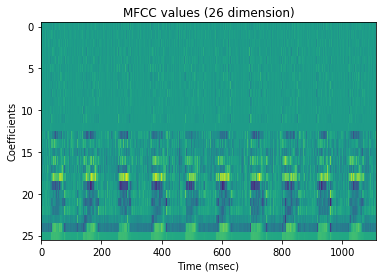

Input dimension: (1111, 26)


In [2]:
# Read sound
n_examples = 1
srate, sig = wavfile.read('da_ta_long.wav')
print('srate (Hz):', srate)
print('duration (sec):', len(sig)/srate)
plt.plot(np.arange(len(sig))/srate, sig)
plt.title('da_ta_long.wav')
plt.xlabel('Time (sec)')
plt.ylabel('Amplitude')
plt.show()

winlen = 0.025
winstep = 0.01
numcep = 13
mfcc_raw = mfcc(sig, srate, winlen, winstep, numcep,
                appendEnergy = True) # 13-d MFCC
mfcc_deriv1 = delta(mfcc_raw, N = 2) # 1st deriv
mfccs = np.concatenate((mfcc_raw, mfcc_deriv1), axis=1).astype(np.float32)
# mfccs = mfcc_raw
plt.imshow(np.rot90(mfccs, axes=(0,1)), aspect='auto')
plt.title('MFCC values (26 dimension)')
plt.xlabel('Time (msec)')
plt.ylabel('Coefficients')
plt.show()

print('Input dimension:',mfccs.shape)

In [3]:
# Read textgrid
T = textgrid.TextGrid()
T.read('da_ta_long.TextGrid')
w_tier = T.getFirst('Phone').intervals
time_mark = winlen/2 + winstep*np.arange(0, mfccs.shape[0])
time_mark = time_mark.astype('float32')

words_raw = []
for t in time_mark:
    for ival in range(len(w_tier)):
        if t > w_tier[ival].bounds()[0] and t <= w_tier[ival].bounds()[1]:
            words_raw.append(w_tier[ival].mark)

words_list = list(set(words_raw)) # unique word list
words_idx = {w: i for i, w in enumerate(words_list)}
words_data = [words_idx[w] for w in words_raw]
words_data_onehot = tf.one_hot(words_data,
                              depth = len(words_list),
                              on_value = 1.,
                              off_value = 0.,
                              axis = 1,
                              dtype=tf.float32)
with tf.Session() as sess: # convert from Tensor to numpy array
    words_label = words_data_onehot.eval()
print('words_list:',words_list)
print('output dimension:',words_label.shape)

words_list: ['a', 'sil', 'd', 't']
output dimension: (1111, 4)


In [4]:
# Hyper-Parameters
learning_rate = 0.01
max_iter = 500

# Network Parameters
n_input_dim = mfccs.shape[1]
n_input_len = mfccs.shape[0]
n_output_dim = words_label.shape[1]
n_output_len = words_label.shape[0]
n_hidden = 300

# TensorFlow graph
# (batch_size) x (time_step) x (input_dimension)
x = tf.placeholder(tf.float32, [1, None, n_input_dim])
# (batch_size) x (time_step) x (output_dimension)
y = tf.placeholder(tf.float32, [1, None, n_output_dim])

# Parameters
weights = {
    'out': tf.Variable(tf.random_normal([n_hidden, n_output_dim]))
}
biases = {
    'out': tf.Variable(tf.random_normal([n_output_dim]))
}

In [5]:
def RNN(x, weights, biases):
    lstm = tf.contrib.rnn.BasicLSTMCell(n_hidden, forget_bias=1.0)
    outputs, states = tf.nn.dynamic_rnn(lstm, x, dtype=tf.float32)
    return tf.matmul(outputs[-1], weights['out']) + biases['out'], outputs

pred = RNN(x, weights, biases)
cost = 
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

Epoch = 1 / 500 Cost =  27.97413


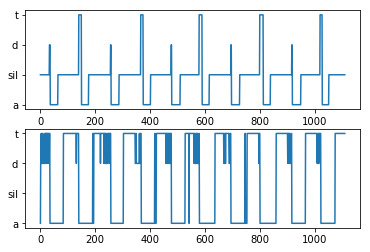

Epoch = 2 / 500 Cost =  935.91156


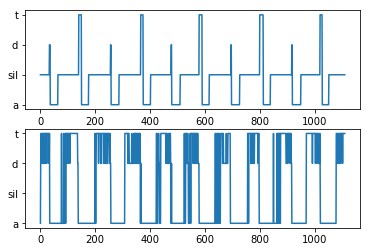

Epoch = 3 / 500 Cost =  128.54828


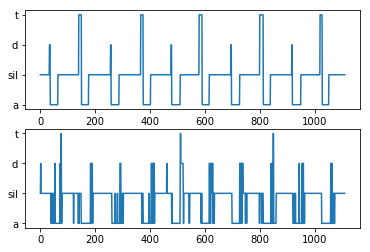

Epoch = 4 / 500 Cost =  15.55757


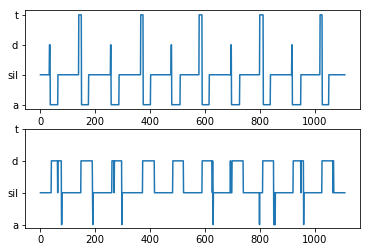

Epoch = 5 / 500 Cost =  33.81203


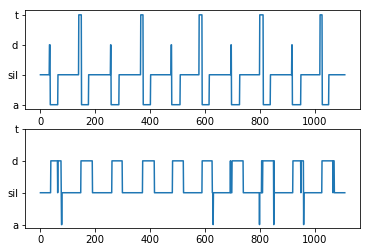

Epoch = 6 / 500 Cost =  35.18871


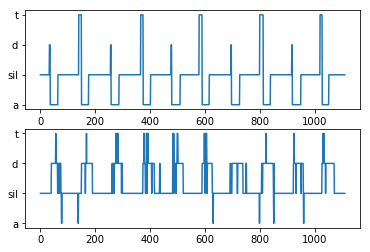

Epoch = 7 / 500 Cost =  23.70167


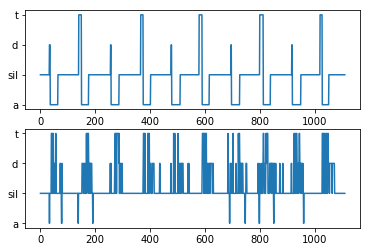

Epoch = 8 / 500 Cost =  13.66955


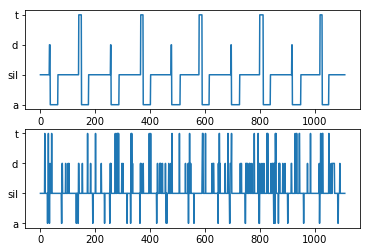

Epoch = 9 / 500 Cost =  7.34576


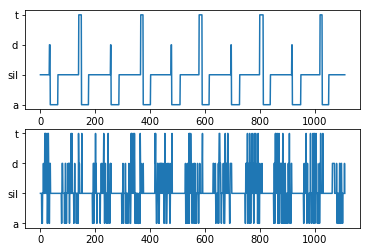

Epoch = 10 / 500 Cost =  4.17566


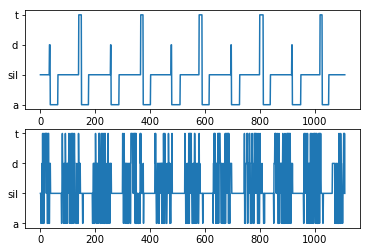

Epoch = 11 / 500 Cost =  3.01258


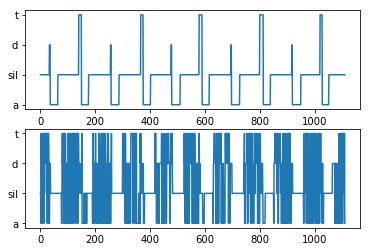

Epoch = 12 / 500 Cost =  2.61231


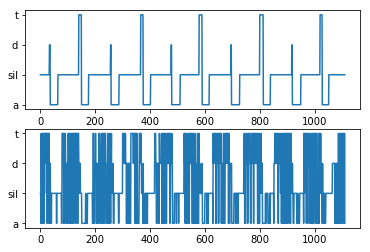

Epoch = 13 / 500 Cost =  2.49624


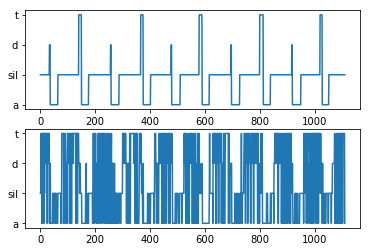

Epoch = 14 / 500 Cost =  2.44313


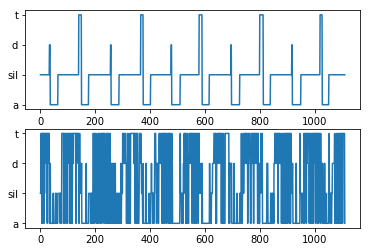

Epoch = 15 / 500 Cost =  2.34507


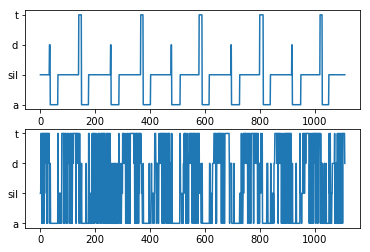

Epoch = 16 / 500 Cost =  2.17492


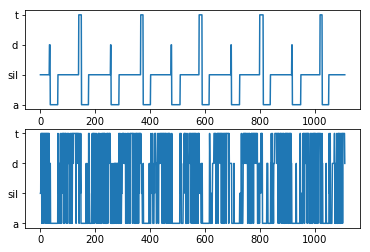

Epoch = 17 / 500 Cost =  1.94412


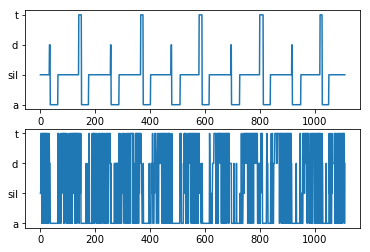

Epoch = 18 / 500 Cost =  1.73462


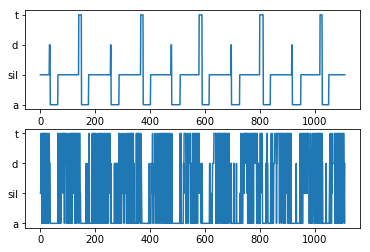

Epoch = 19 / 500 Cost =  1.53232


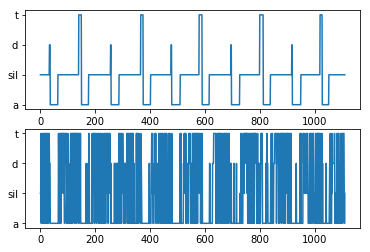

Epoch = 20 / 500 Cost =  1.35046


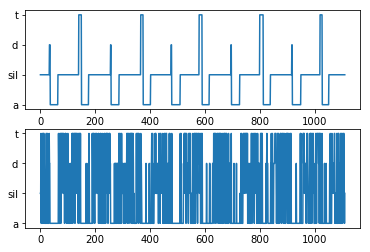

Epoch = 21 / 500 Cost =  1.20103


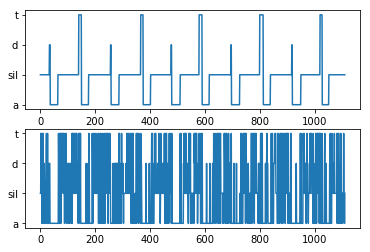

Epoch = 22 / 500 Cost =  1.08754


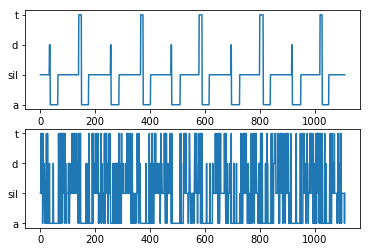

Epoch = 23 / 500 Cost =  1.00659


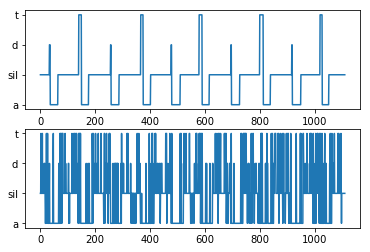

Epoch = 24 / 500 Cost =  0.95119


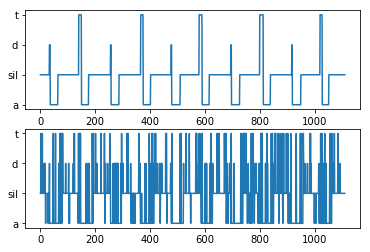

Epoch = 25 / 500 Cost =  0.91327


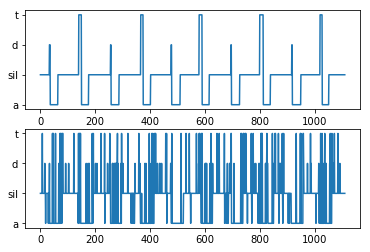

Epoch = 26 / 500 Cost =  0.88449


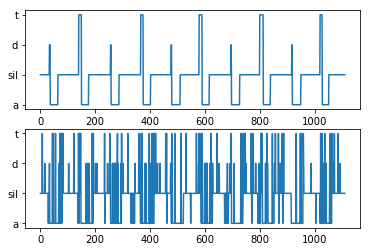

Epoch = 27 / 500 Cost =  0.85688


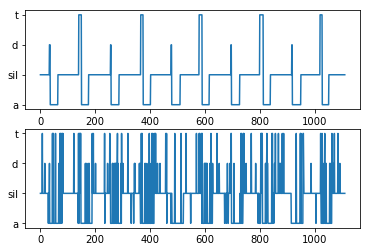

Epoch = 28 / 500 Cost =  0.82467


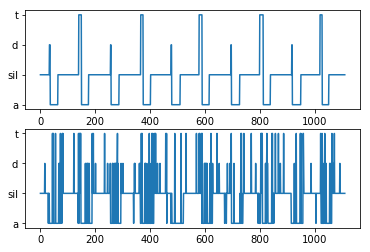

Epoch = 29 / 500 Cost =  0.78534


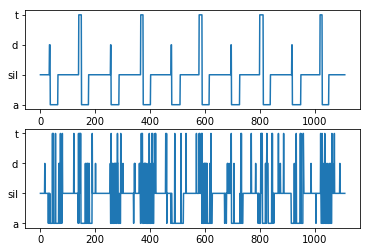

Epoch = 30 / 500 Cost =  0.73866


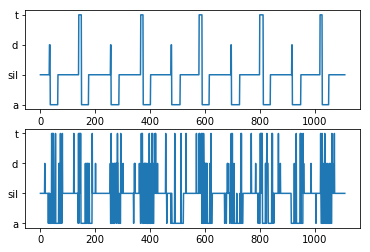

Epoch = 31 / 500 Cost =  0.68656


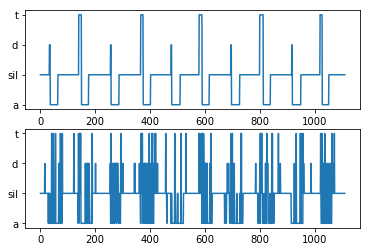

Epoch = 32 / 500 Cost =  0.63200


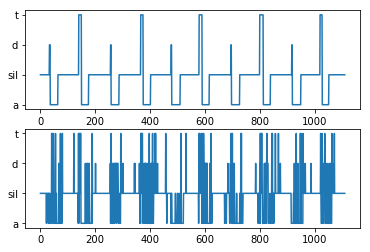

Epoch = 33 / 500 Cost =  0.57818


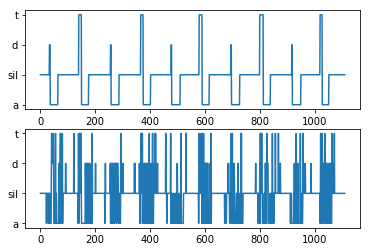

Epoch = 34 / 500 Cost =  0.52791


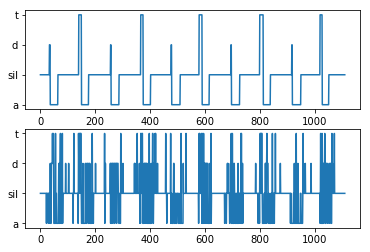

Epoch = 35 / 500 Cost =  0.48333


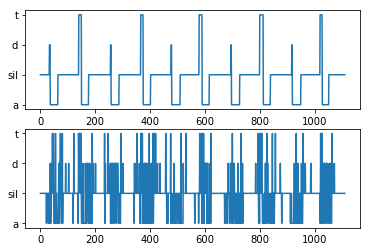

Epoch = 36 / 500 Cost =  0.44576


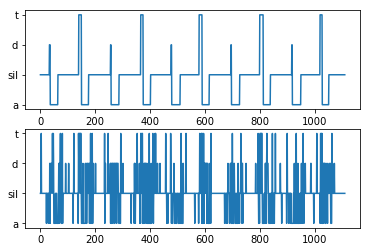

Epoch = 37 / 500 Cost =  0.41577


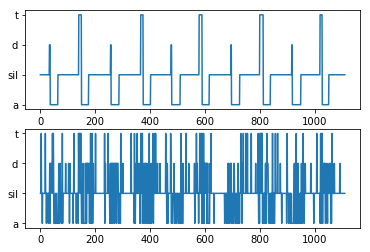

Epoch = 38 / 500 Cost =  0.39324


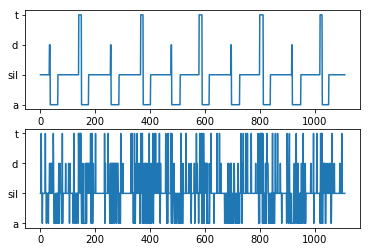

Epoch = 39 / 500 Cost =  0.37732


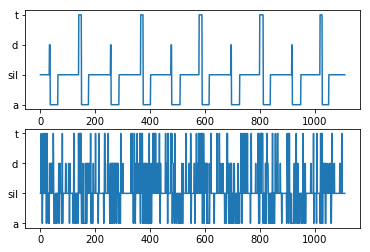

Epoch = 40 / 500 Cost =  0.36659


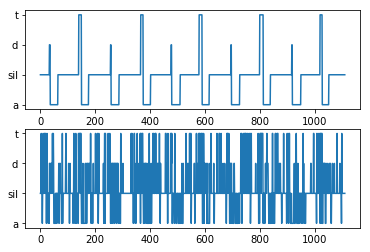

Epoch = 41 / 500 Cost =  0.35922


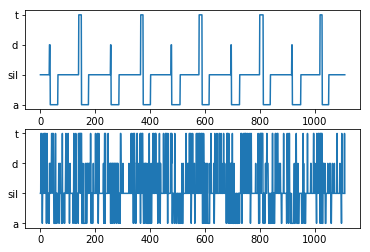

Epoch = 42 / 500 Cost =  0.35325


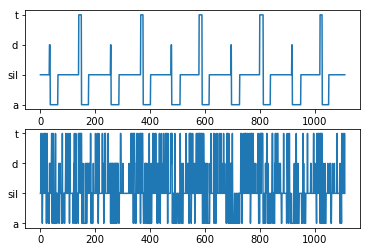

Epoch = 43 / 500 Cost =  0.34706


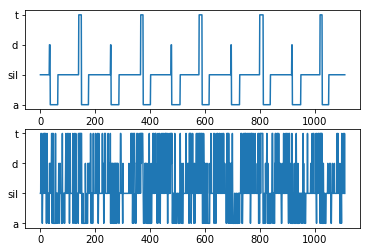

Epoch = 44 / 500 Cost =  0.33951


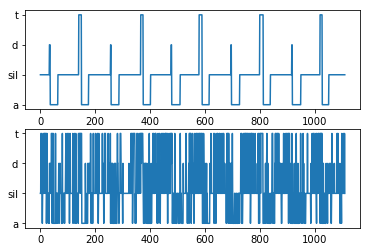

Epoch = 45 / 500 Cost =  0.33001


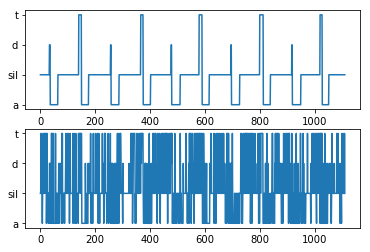

Epoch = 46 / 500 Cost =  0.31831


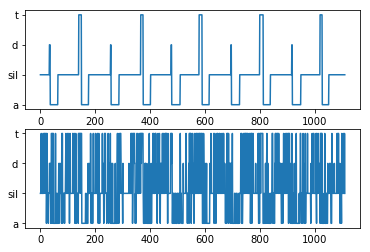

Epoch = 47 / 500 Cost =  0.30455


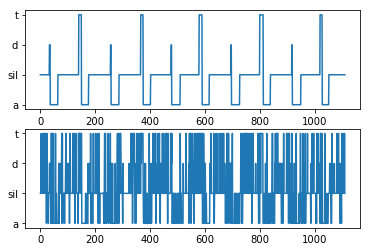

Epoch = 48 / 500 Cost =  0.28921


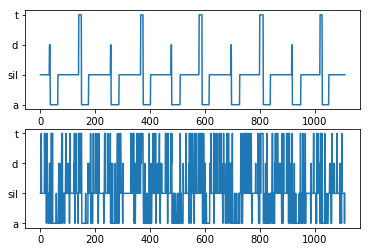

Epoch = 49 / 500 Cost =  0.27313


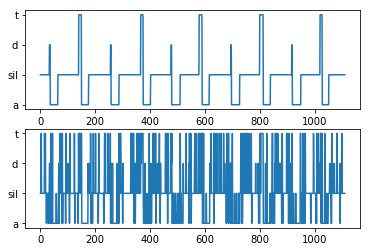

Epoch = 50 / 500 Cost =  0.25734


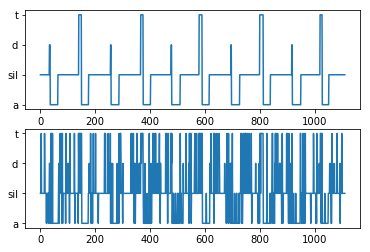

Epoch = 51 / 500 Cost =  0.24288


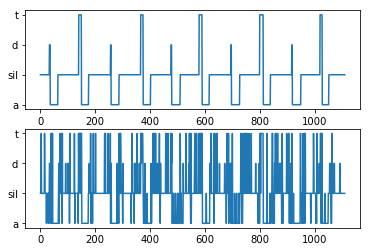

Epoch = 52 / 500 Cost =  0.23033


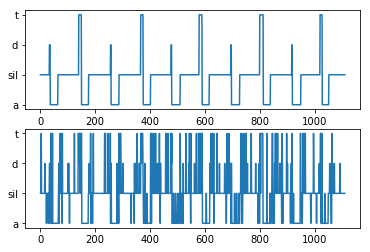

Epoch = 53 / 500 Cost =  0.21993


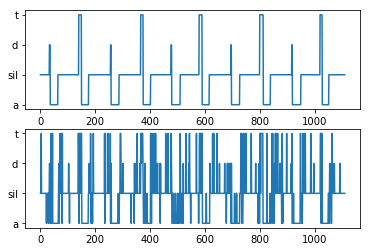

Epoch = 54 / 500 Cost =  0.21169


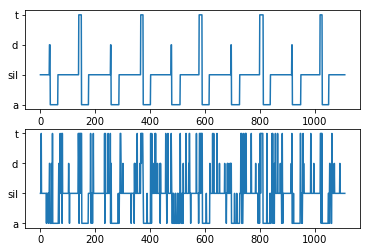

Epoch = 55 / 500 Cost =  0.20538


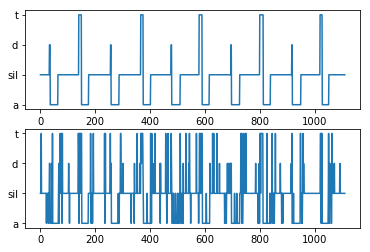

Epoch = 56 / 500 Cost =  0.20054


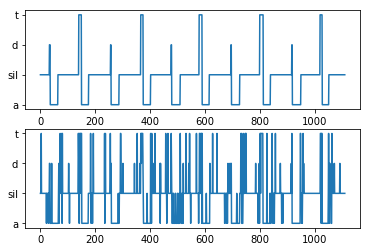

Epoch = 57 / 500 Cost =  0.19660


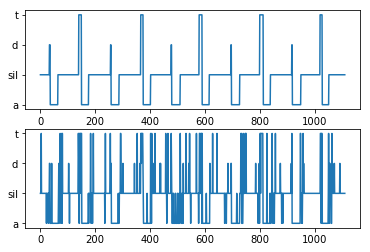

Epoch = 58 / 500 Cost =  0.19303


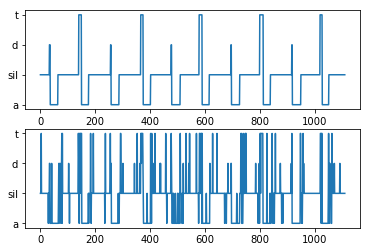

Epoch = 59 / 500 Cost =  0.18941


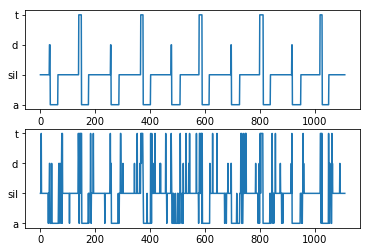

Epoch = 60 / 500 Cost =  0.18545


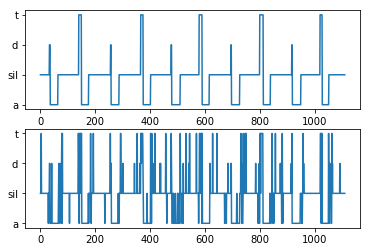

Epoch = 61 / 500 Cost =  0.18104


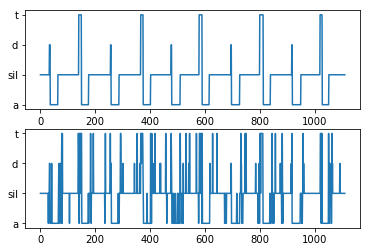

Epoch = 62 / 500 Cost =  0.17617


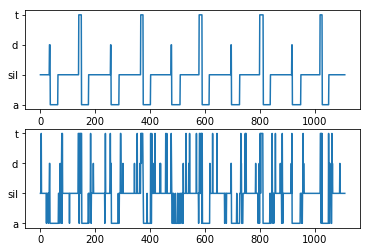

Epoch = 63 / 500 Cost =  0.17093


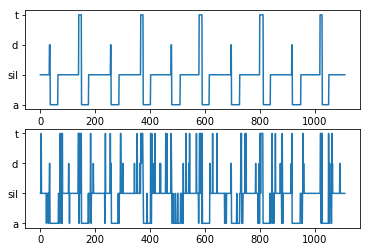

Epoch = 64 / 500 Cost =  0.16553


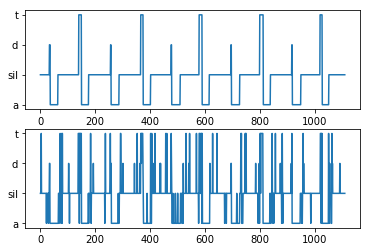

Epoch = 65 / 500 Cost =  0.16020


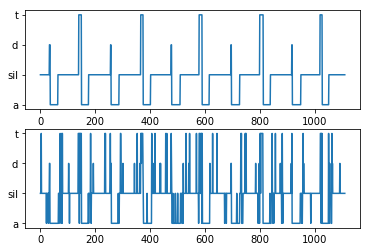

Epoch = 66 / 500 Cost =  0.15520


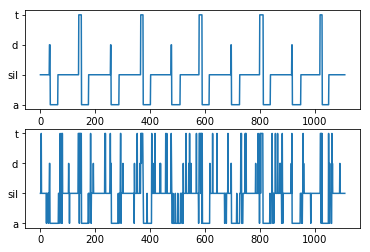

Epoch = 67 / 500 Cost =  0.15069


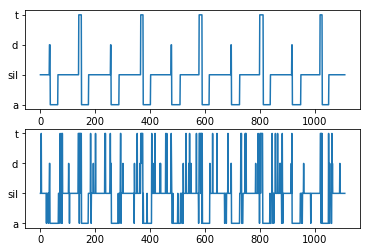

Epoch = 68 / 500 Cost =  0.14675


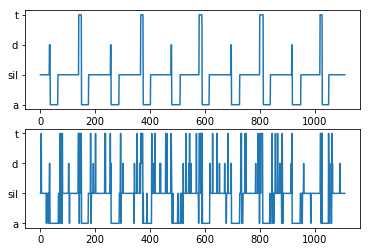

Epoch = 69 / 500 Cost =  0.14333


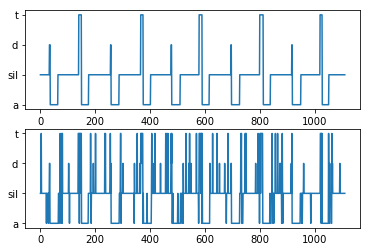

Epoch = 70 / 500 Cost =  0.14033


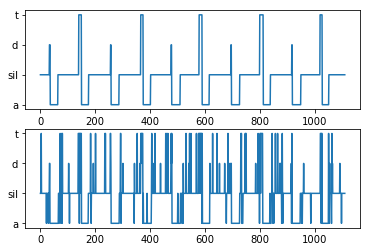

Epoch = 71 / 500 Cost =  0.13762


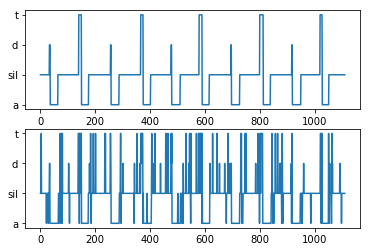

Epoch = 72 / 500 Cost =  0.13508


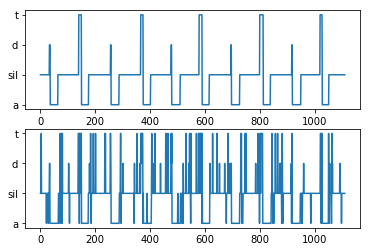

Epoch = 73 / 500 Cost =  0.13259


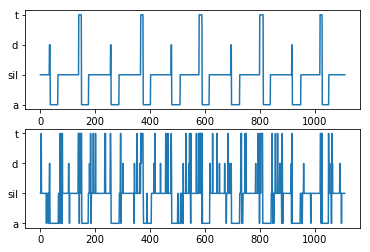

Epoch = 74 / 500 Cost =  0.13009


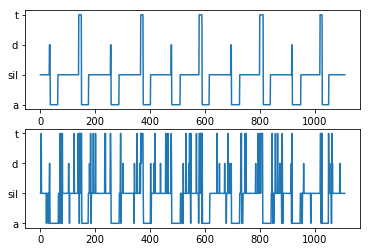

Epoch = 75 / 500 Cost =  0.12754


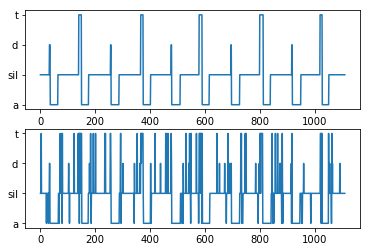

Epoch = 76 / 500 Cost =  0.12493


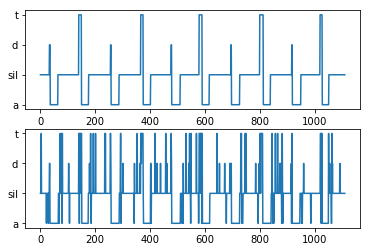

Epoch = 77 / 500 Cost =  0.12229


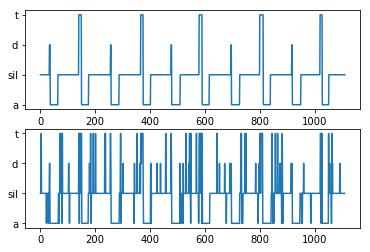

Epoch = 78 / 500 Cost =  0.11969


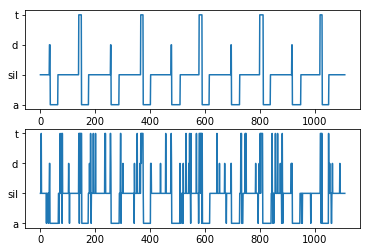

Epoch = 79 / 500 Cost =  0.11720


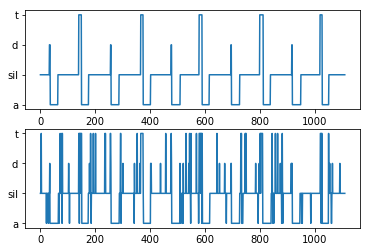

Epoch = 80 / 500 Cost =  0.11487


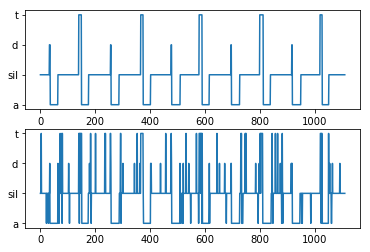

Epoch = 81 / 500 Cost =  0.11273


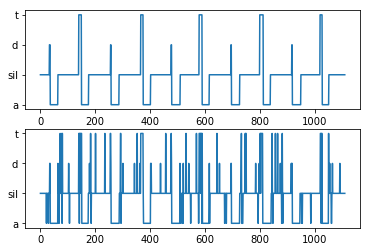

Epoch = 82 / 500 Cost =  0.11076


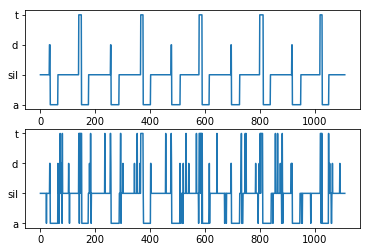

Epoch = 83 / 500 Cost =  0.10893


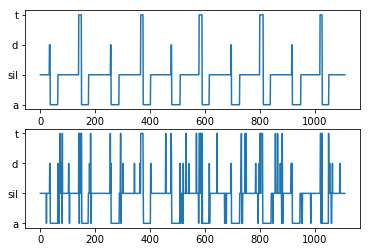

Epoch = 84 / 500 Cost =  0.10719


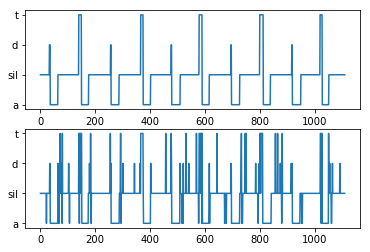

Epoch = 85 / 500 Cost =  0.10551


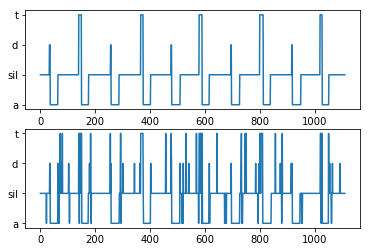

Epoch = 86 / 500 Cost =  0.10387


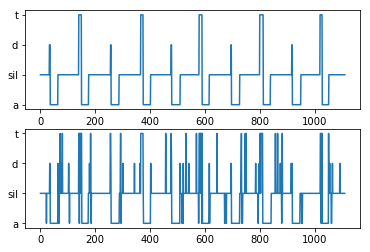

Epoch = 87 / 500 Cost =  0.10223


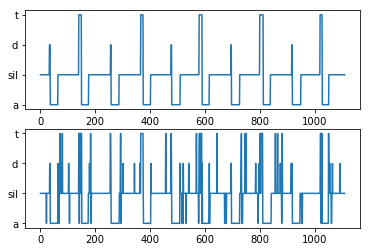

Epoch = 88 / 500 Cost =  0.10059


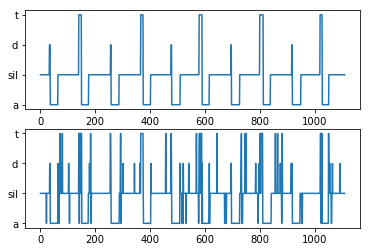

Epoch = 89 / 500 Cost =  0.09896


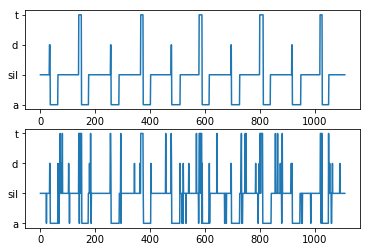

Epoch = 90 / 500 Cost =  0.09736


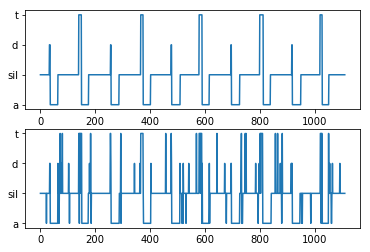

Epoch = 91 / 500 Cost =  0.09579


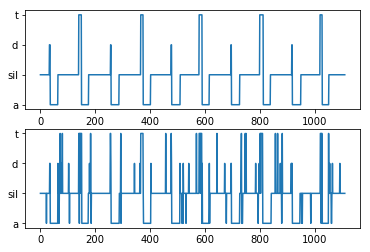

Epoch = 92 / 500 Cost =  0.09429


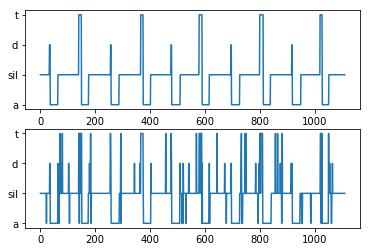

Epoch = 93 / 500 Cost =  0.09285


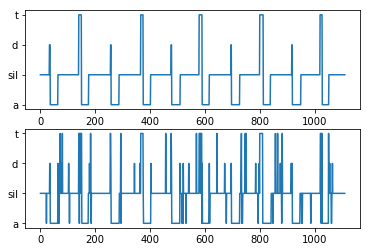

Epoch = 94 / 500 Cost =  0.09149


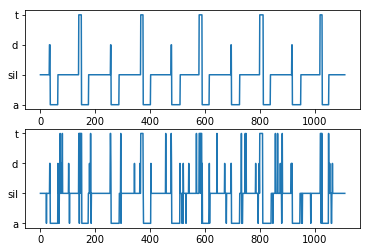

Epoch = 95 / 500 Cost =  0.09018


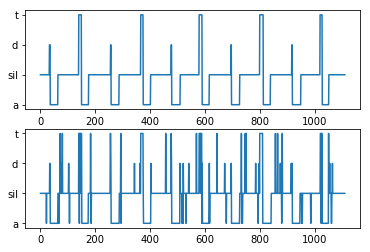

Epoch = 96 / 500 Cost =  0.08893


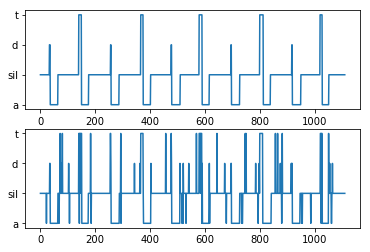

Epoch = 97 / 500 Cost =  0.08771


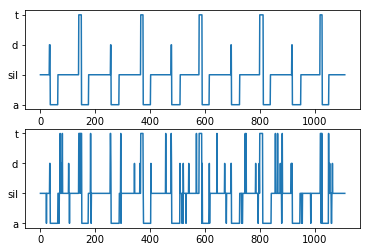

Epoch = 98 / 500 Cost =  0.08652


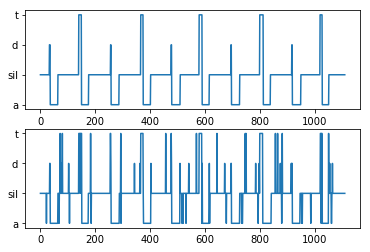

Epoch = 99 / 500 Cost =  0.08535


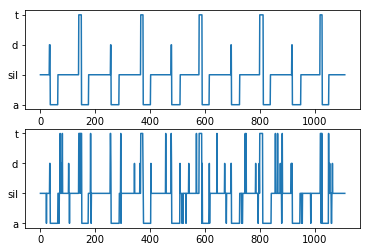

Epoch = 100 / 500 Cost =  0.08421


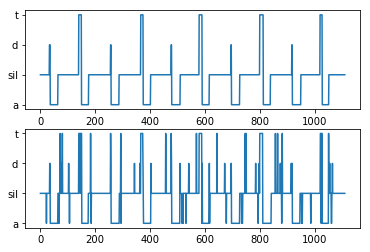

Epoch = 101 / 500 Cost =  0.08307


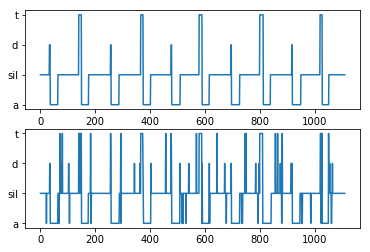

Epoch = 102 / 500 Cost =  0.08195


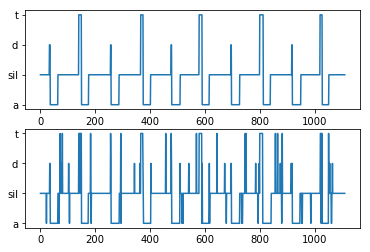

Epoch = 103 / 500 Cost =  0.08086


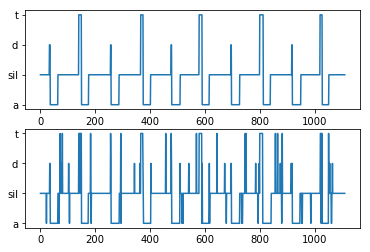

Epoch = 104 / 500 Cost =  0.07979


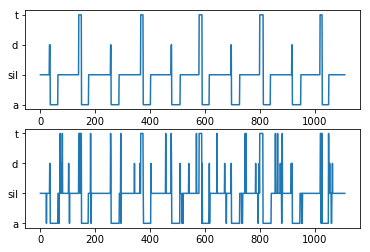

Epoch = 105 / 500 Cost =  0.07875


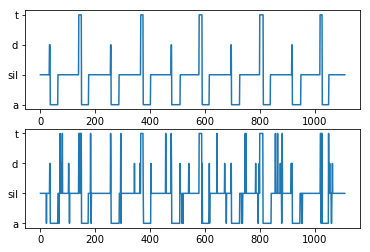

Epoch = 106 / 500 Cost =  0.07774


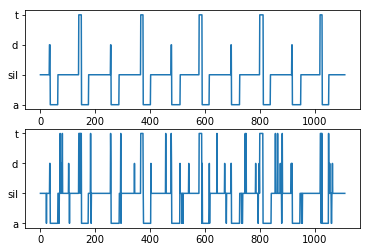

Epoch = 107 / 500 Cost =  0.07676


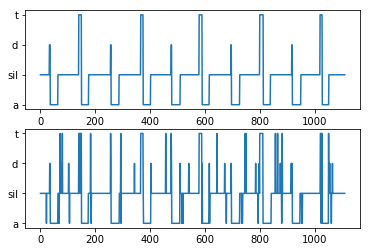

Epoch = 108 / 500 Cost =  0.07581


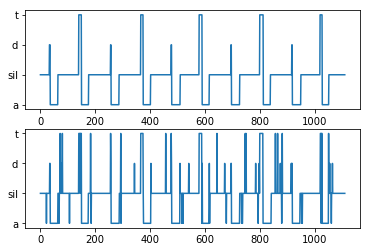

Epoch = 109 / 500 Cost =  0.07490


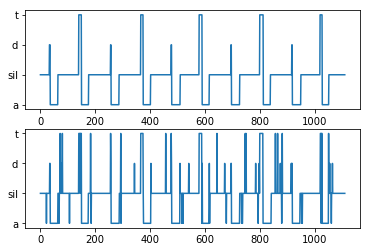

Epoch = 110 / 500 Cost =  0.07400


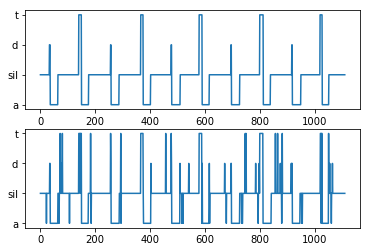

Epoch = 111 / 500 Cost =  0.07313


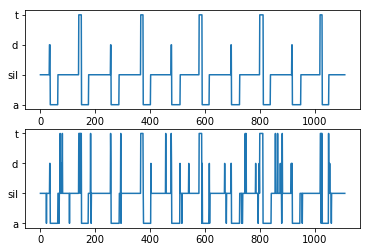

Epoch = 112 / 500 Cost =  0.07227


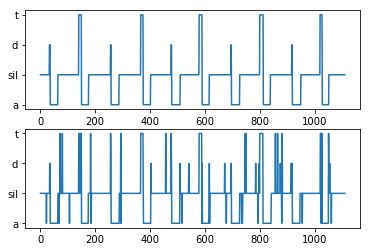

Epoch = 113 / 500 Cost =  0.07142


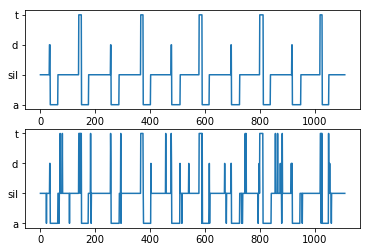

Epoch = 114 / 500 Cost =  0.07059


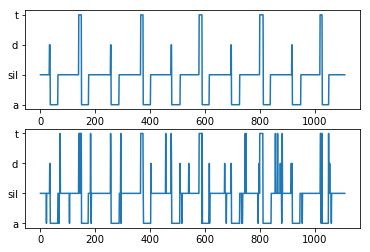

Epoch = 115 / 500 Cost =  0.06977


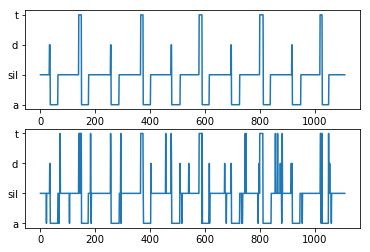

Epoch = 116 / 500 Cost =  0.06897


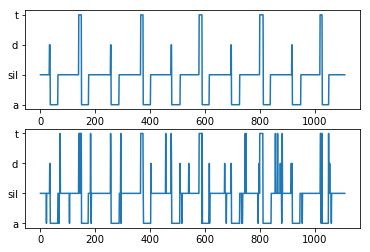

Epoch = 117 / 500 Cost =  0.06818


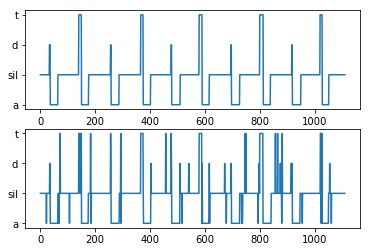

Epoch = 118 / 500 Cost =  0.06741


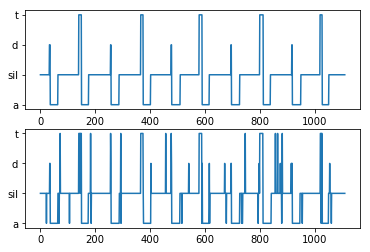

Epoch = 119 / 500 Cost =  0.06667


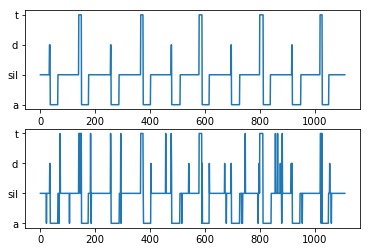

Epoch = 120 / 500 Cost =  0.06593


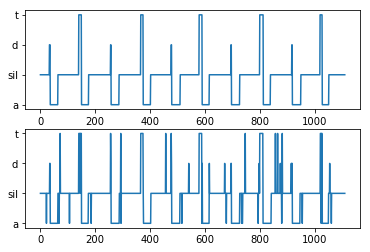

Epoch = 121 / 500 Cost =  0.06522


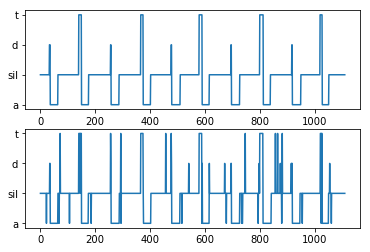

Epoch = 122 / 500 Cost =  0.06452


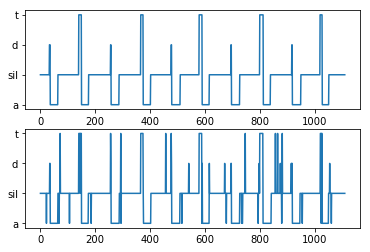

Epoch = 123 / 500 Cost =  0.06383


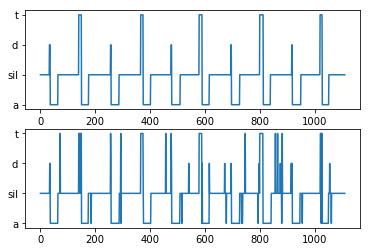

Epoch = 124 / 500 Cost =  0.06315


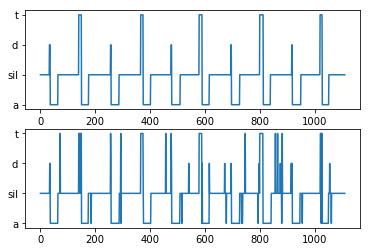

Epoch = 125 / 500 Cost =  0.06248


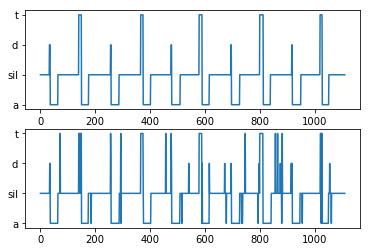

Epoch = 126 / 500 Cost =  0.06182


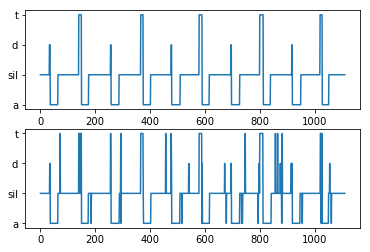

Epoch = 127 / 500 Cost =  0.06117


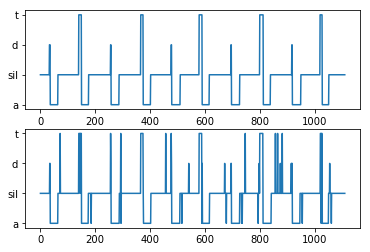

Epoch = 128 / 500 Cost =  0.06054


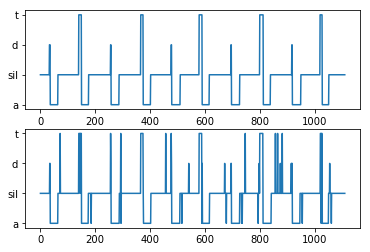

Epoch = 129 / 500 Cost =  0.05991


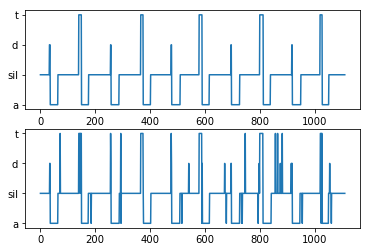

Epoch = 130 / 500 Cost =  0.05930


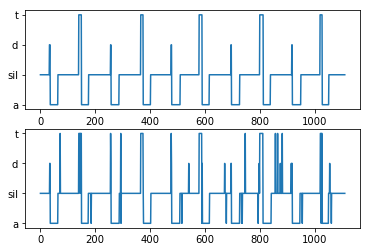

Epoch = 131 / 500 Cost =  0.05870


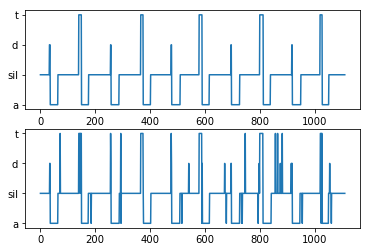

Epoch = 132 / 500 Cost =  0.05810


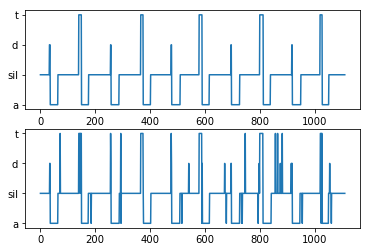

Epoch = 133 / 500 Cost =  0.05752


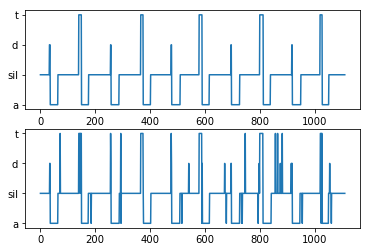

Epoch = 134 / 500 Cost =  0.05695


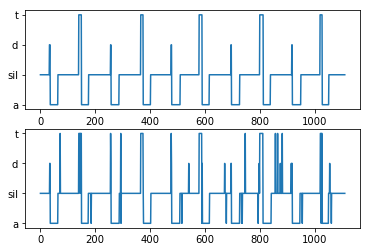

Epoch = 135 / 500 Cost =  0.05639


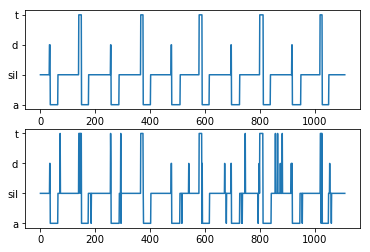

Epoch = 136 / 500 Cost =  0.05583


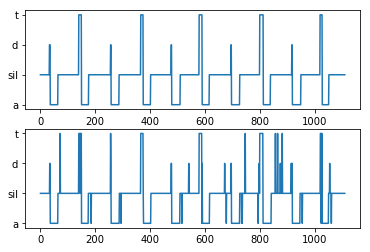

Epoch = 137 / 500 Cost =  0.05529


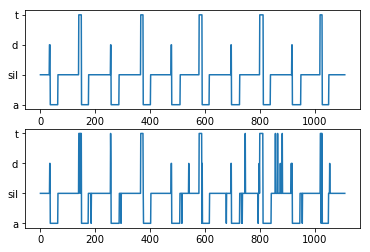

Epoch = 138 / 500 Cost =  0.05475


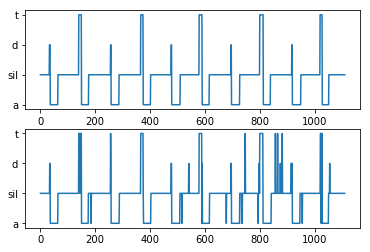

Epoch = 139 / 500 Cost =  0.05422


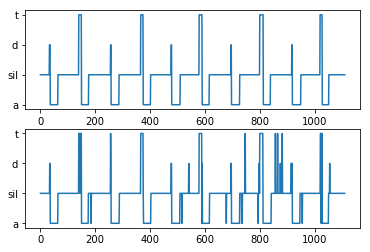

Epoch = 140 / 500 Cost =  0.05370


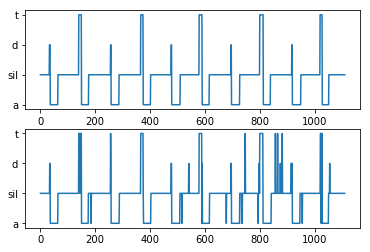

Epoch = 141 / 500 Cost =  0.05318


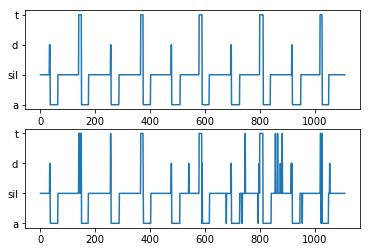

Epoch = 142 / 500 Cost =  0.05268


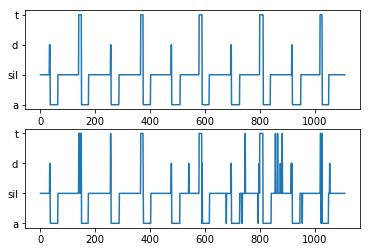

Epoch = 143 / 500 Cost =  0.05218


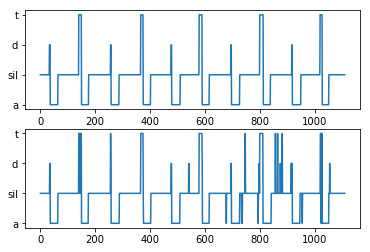

Epoch = 144 / 500 Cost =  0.05169


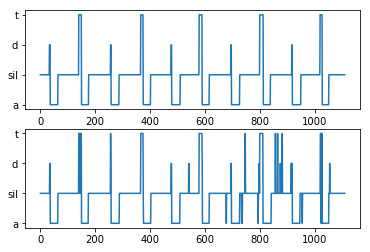

Epoch = 145 / 500 Cost =  0.05121


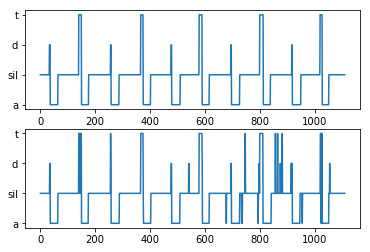

Epoch = 146 / 500 Cost =  0.05073


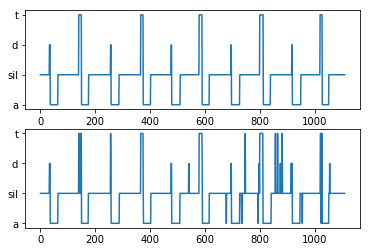

Epoch = 147 / 500 Cost =  0.05026


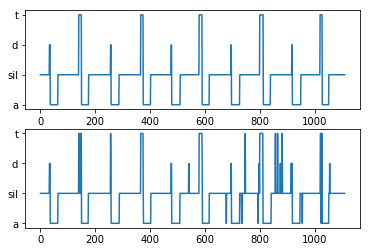

Epoch = 148 / 500 Cost =  0.04980


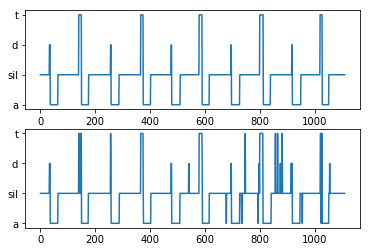

Epoch = 149 / 500 Cost =  0.04934


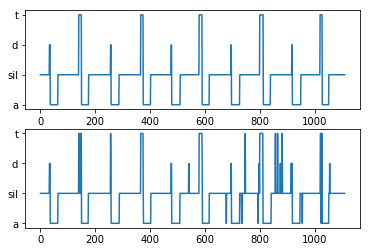

Epoch = 150 / 500 Cost =  0.04889


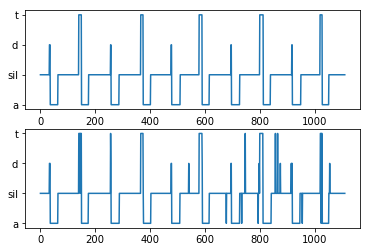

Epoch = 151 / 500 Cost =  0.04845


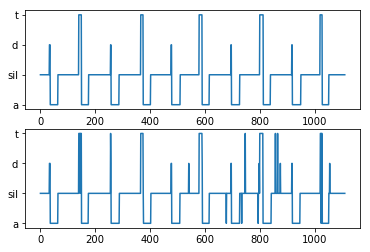

Epoch = 152 / 500 Cost =  0.04801


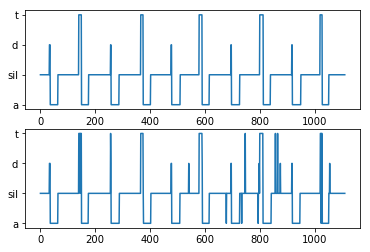

Epoch = 153 / 500 Cost =  0.04758


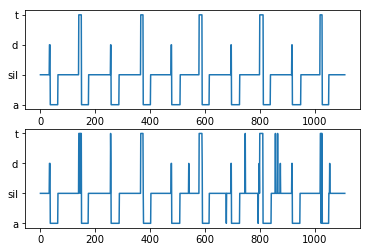

Epoch = 154 / 500 Cost =  0.04715


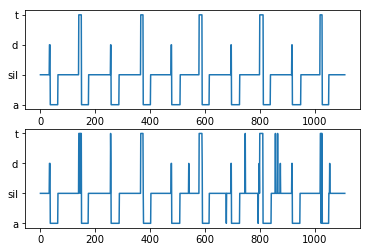

Epoch = 155 / 500 Cost =  0.04673


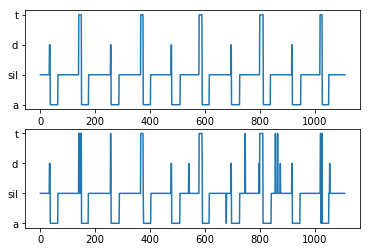

Epoch = 156 / 500 Cost =  0.04632


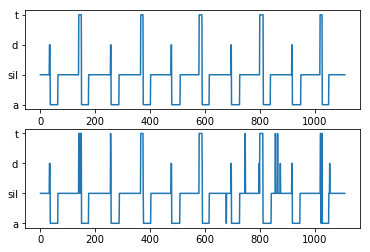

Epoch = 157 / 500 Cost =  0.04591


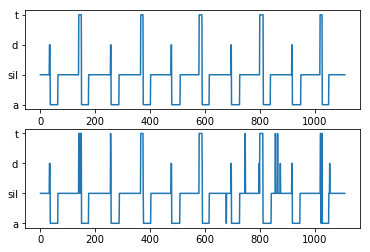

Epoch = 158 / 500 Cost =  0.04551


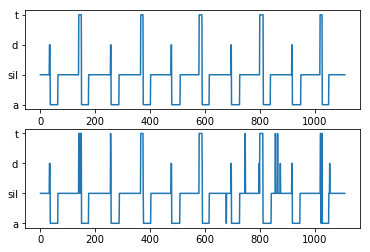

Epoch = 159 / 500 Cost =  0.04511


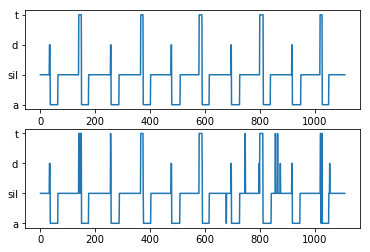

Epoch = 160 / 500 Cost =  0.04472


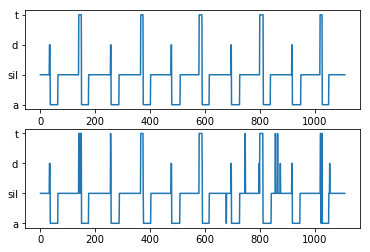

Epoch = 161 / 500 Cost =  0.04433


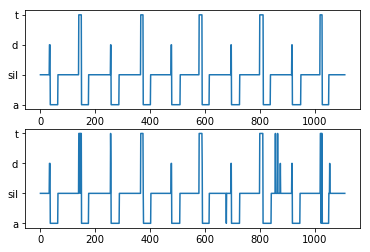

Epoch = 162 / 500 Cost =  0.04395


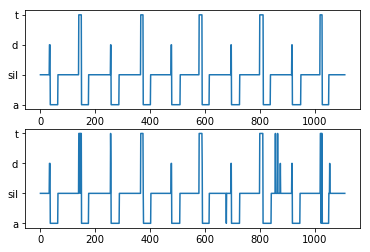

Epoch = 163 / 500 Cost =  0.04357


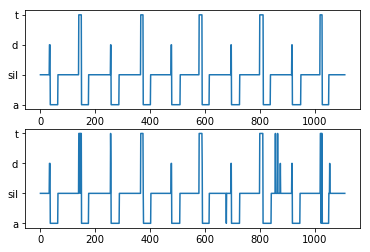

Epoch = 164 / 500 Cost =  0.04320


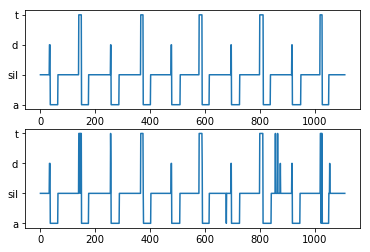

Epoch = 165 / 500 Cost =  0.04283


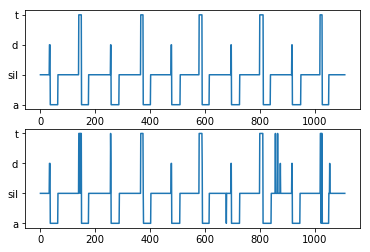

Epoch = 166 / 500 Cost =  0.04247


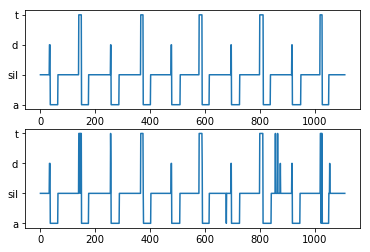

Epoch = 167 / 500 Cost =  0.04211


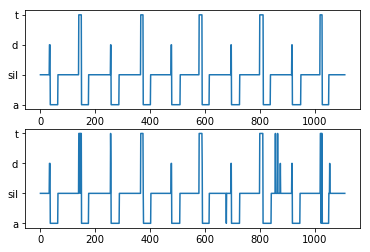

Epoch = 168 / 500 Cost =  0.04176


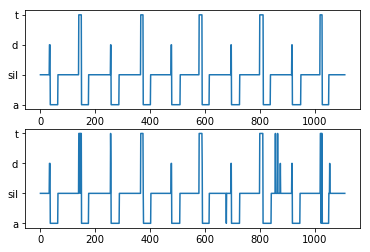

Epoch = 169 / 500 Cost =  0.04141


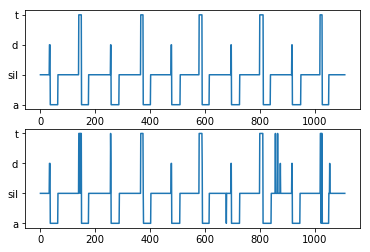

Epoch = 170 / 500 Cost =  0.04107


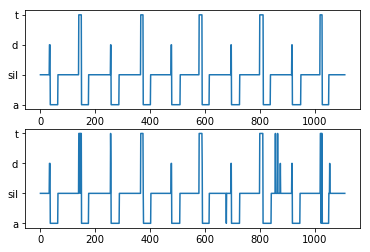

Epoch = 171 / 500 Cost =  0.04073


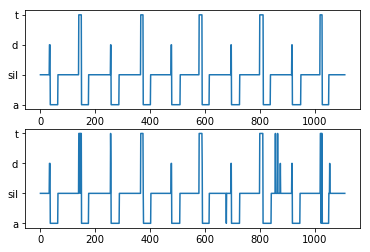

Epoch = 172 / 500 Cost =  0.04039


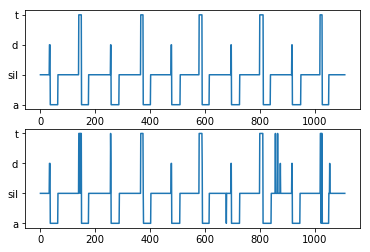

Epoch = 173 / 500 Cost =  0.04006


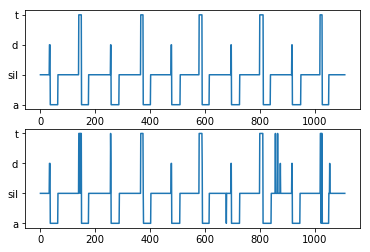

Epoch = 174 / 500 Cost =  0.03973


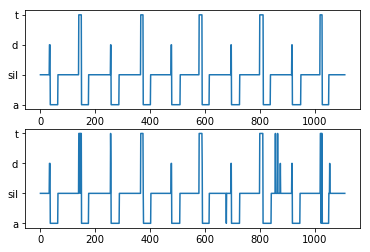

Epoch = 175 / 500 Cost =  0.03941


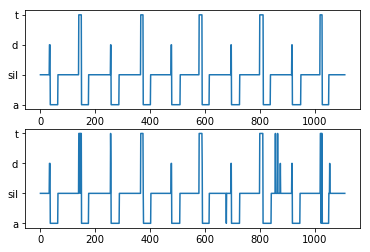

Epoch = 176 / 500 Cost =  0.03909


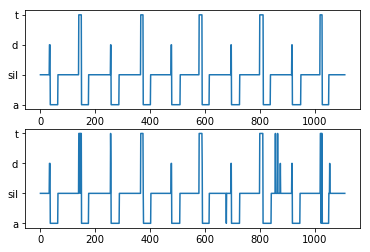

Epoch = 177 / 500 Cost =  0.03878


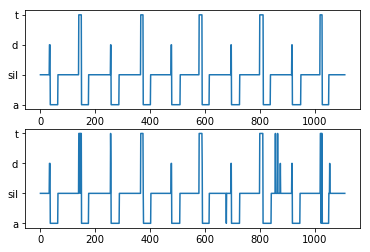

Epoch = 178 / 500 Cost =  0.03847


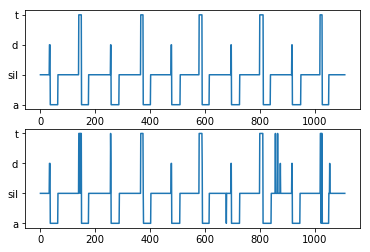

Epoch = 179 / 500 Cost =  0.03816


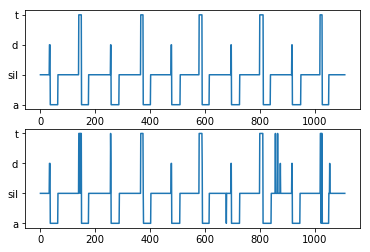

Epoch = 180 / 500 Cost =  0.03786


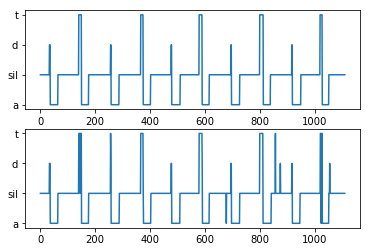

Epoch = 181 / 500 Cost =  0.03756


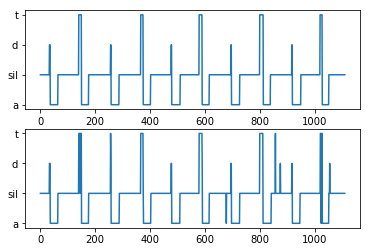

Epoch = 182 / 500 Cost =  0.03727


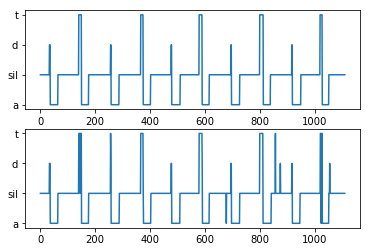

Epoch = 183 / 500 Cost =  0.03698


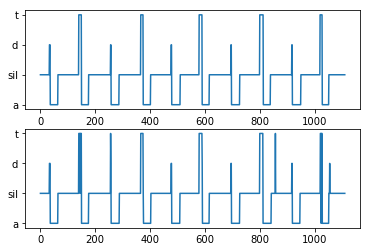

Epoch = 184 / 500 Cost =  0.03669


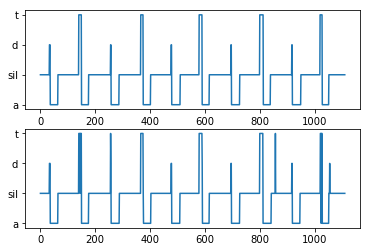

Epoch = 185 / 500 Cost =  0.03641


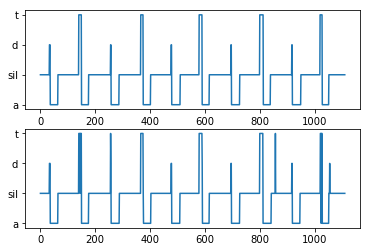

Epoch = 186 / 500 Cost =  0.03613


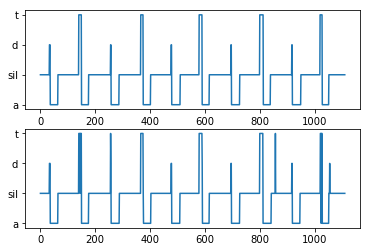

Epoch = 187 / 500 Cost =  0.03585


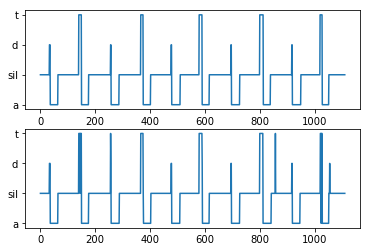

Epoch = 188 / 500 Cost =  0.03558


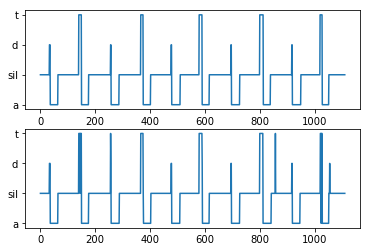

Epoch = 189 / 500 Cost =  0.03531


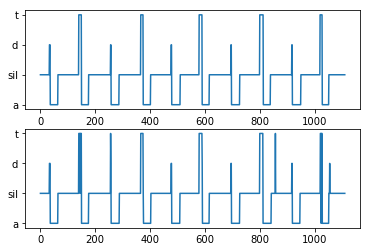

Epoch = 190 / 500 Cost =  0.03505


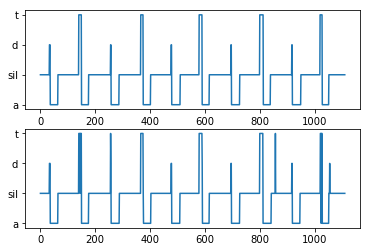

Epoch = 191 / 500 Cost =  0.03479


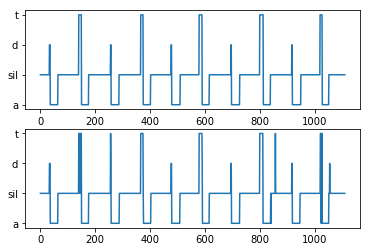

Epoch = 192 / 500 Cost =  0.03453


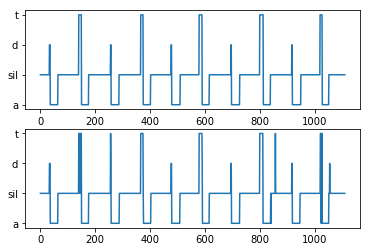

Epoch = 193 / 500 Cost =  0.03427


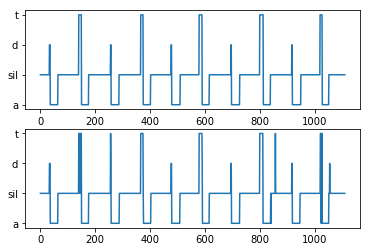

Epoch = 194 / 500 Cost =  0.03402


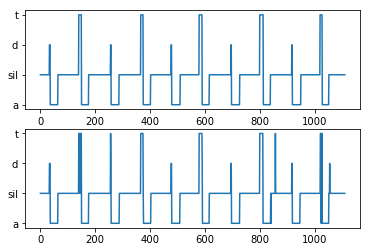

Epoch = 195 / 500 Cost =  0.03377


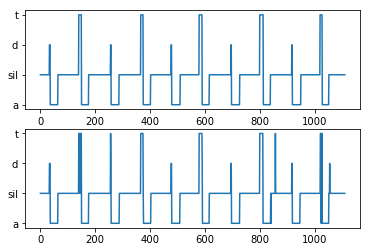

Epoch = 196 / 500 Cost =  0.03353


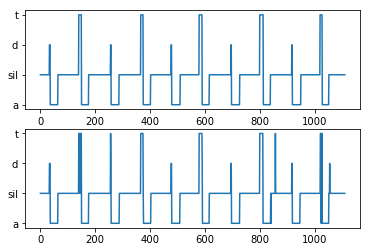

Epoch = 197 / 500 Cost =  0.03329


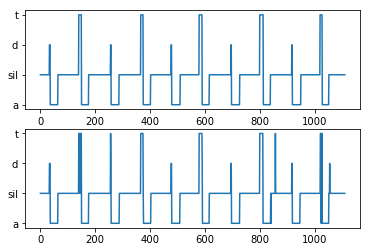

Epoch = 198 / 500 Cost =  0.03305


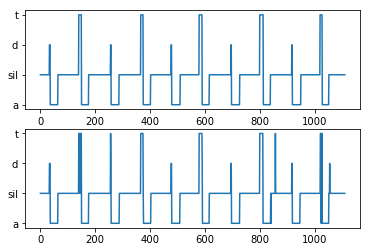

Epoch = 199 / 500 Cost =  0.03281


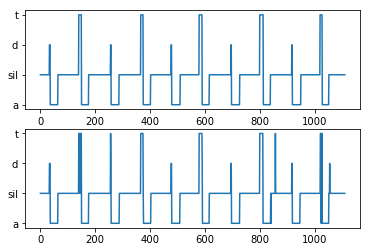

Epoch = 200 / 500 Cost =  0.03258


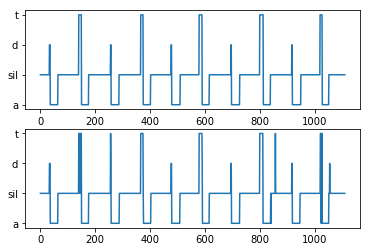

Epoch = 201 / 500 Cost =  0.03235


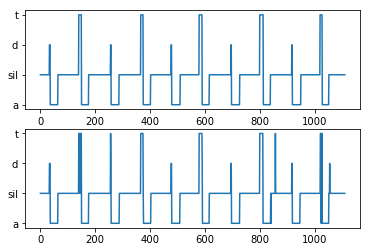

Epoch = 202 / 500 Cost =  0.03212


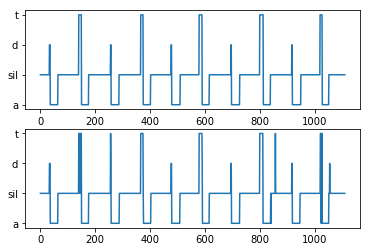

Epoch = 203 / 500 Cost =  0.03190


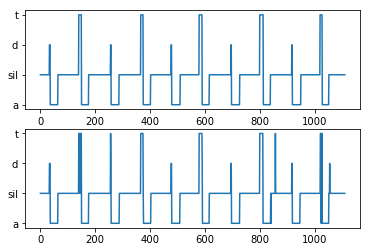

Epoch = 204 / 500 Cost =  0.03168


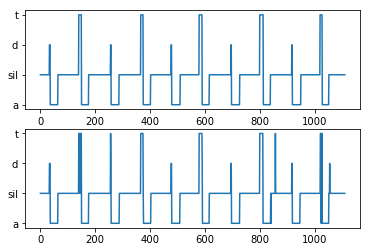

Epoch = 205 / 500 Cost =  0.03146


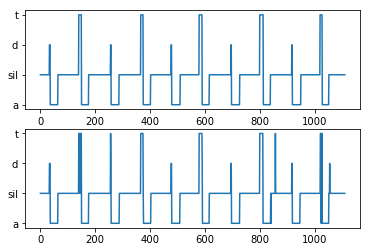

Epoch = 206 / 500 Cost =  0.03124


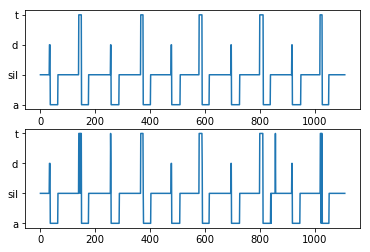

Epoch = 207 / 500 Cost =  0.03103


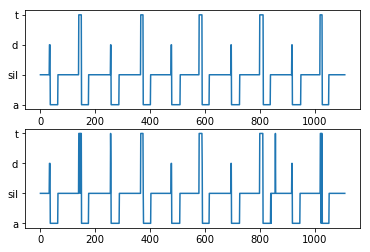

Epoch = 208 / 500 Cost =  0.03082


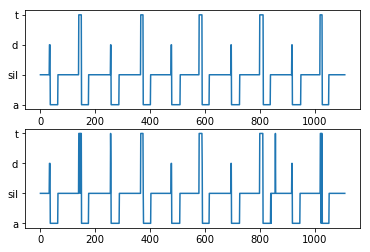

Epoch = 209 / 500 Cost =  0.03061


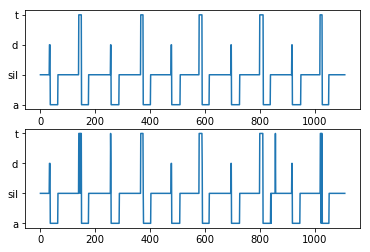

Epoch = 210 / 500 Cost =  0.03040


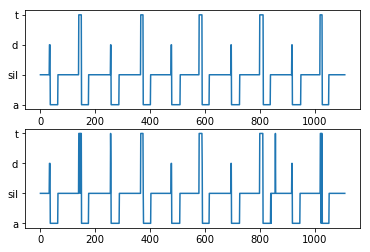

Epoch = 211 / 500 Cost =  0.03020


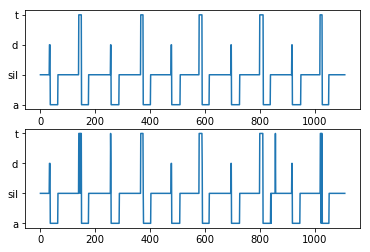

Epoch = 212 / 500 Cost =  0.03000


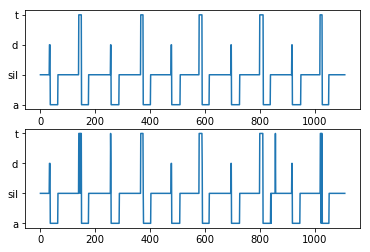

Epoch = 213 / 500 Cost =  0.02980


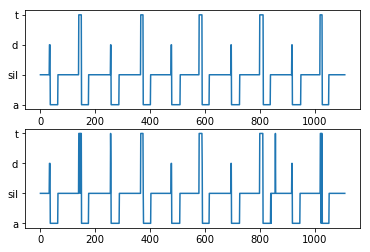

Epoch = 214 / 500 Cost =  0.02961


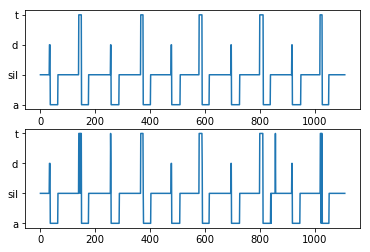

Epoch = 215 / 500 Cost =  0.02941


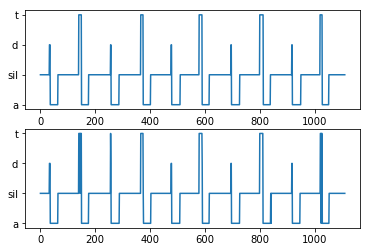

Epoch = 216 / 500 Cost =  0.02922


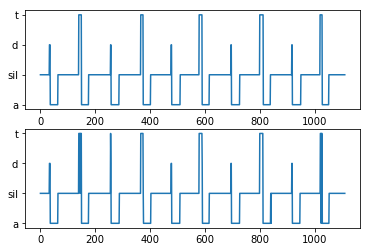

Epoch = 217 / 500 Cost =  0.02903


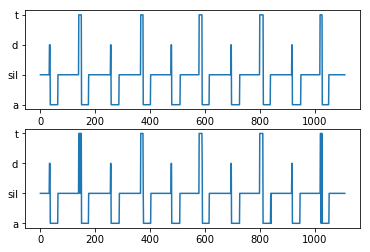

Epoch = 218 / 500 Cost =  0.02884


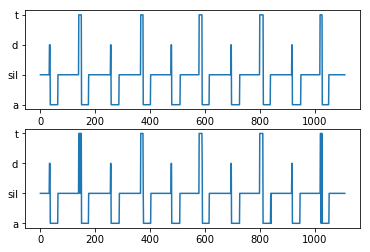

Epoch = 219 / 500 Cost =  0.02866


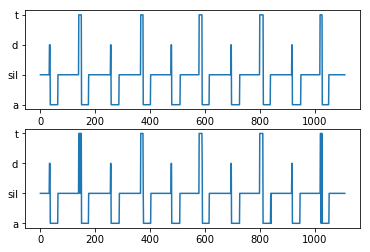

Epoch = 220 / 500 Cost =  0.02847


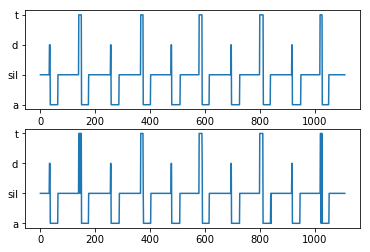

Epoch = 221 / 500 Cost =  0.02829


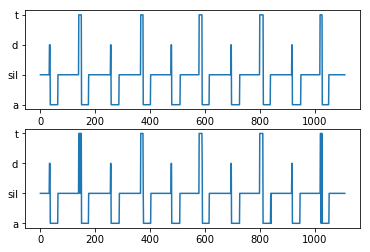

Epoch = 222 / 500 Cost =  0.02811


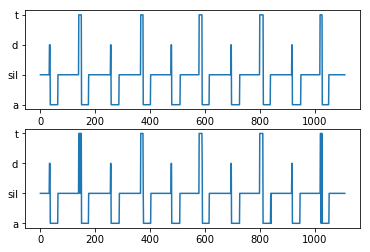

Epoch = 223 / 500 Cost =  0.02794


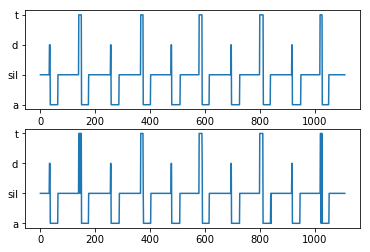

Epoch = 224 / 500 Cost =  0.02776


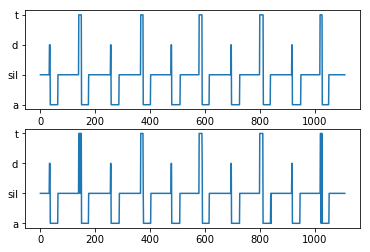

Epoch = 225 / 500 Cost =  0.02759


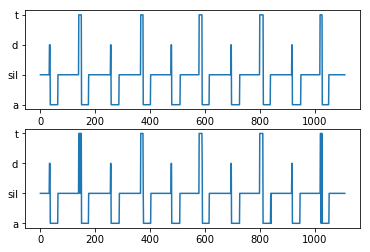

Epoch = 226 / 500 Cost =  0.02742


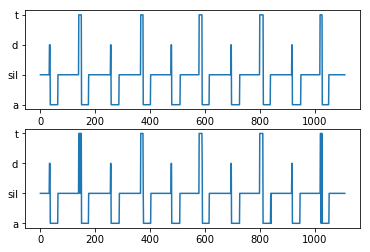

Epoch = 227 / 500 Cost =  0.02725


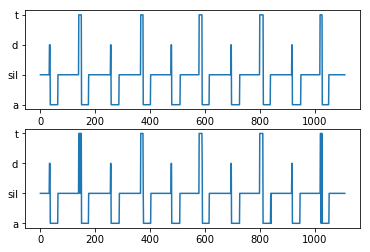

Epoch = 228 / 500 Cost =  0.02708


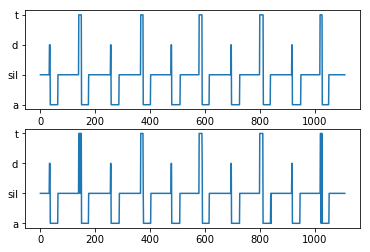

Epoch = 229 / 500 Cost =  0.02691


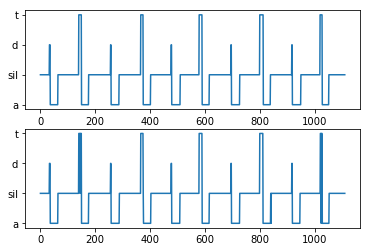

Epoch = 230 / 500 Cost =  0.02675


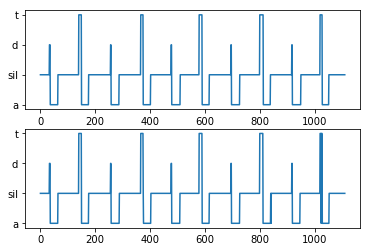

Epoch = 231 / 500 Cost =  0.02659


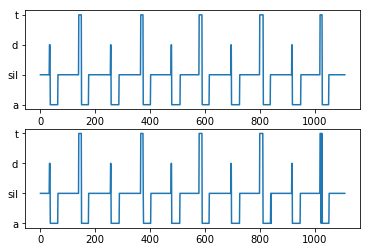

Epoch = 232 / 500 Cost =  0.02643


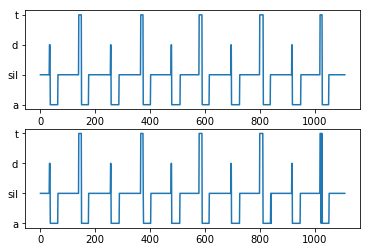

Epoch = 233 / 500 Cost =  0.02627


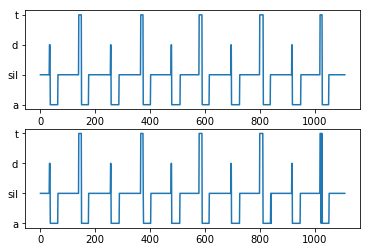

Epoch = 234 / 500 Cost =  0.02611


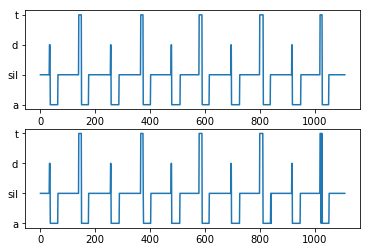

Epoch = 235 / 500 Cost =  0.02595


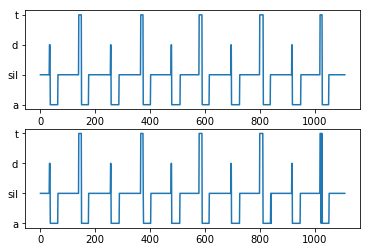

Epoch = 236 / 500 Cost =  0.02580


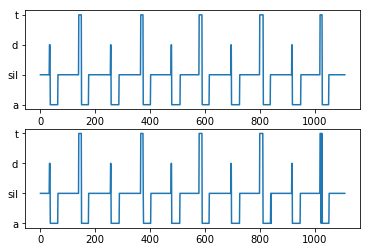

Epoch = 237 / 500 Cost =  0.02565


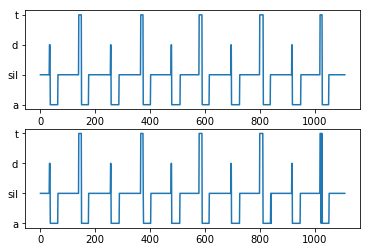

Epoch = 238 / 500 Cost =  0.02550


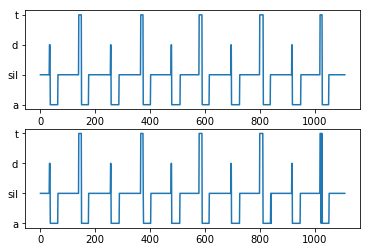

Epoch = 239 / 500 Cost =  0.02535


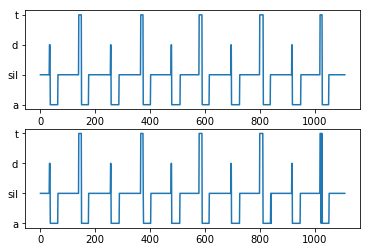

Epoch = 240 / 500 Cost =  0.02520


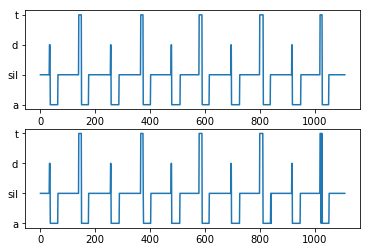

Epoch = 241 / 500 Cost =  0.02505


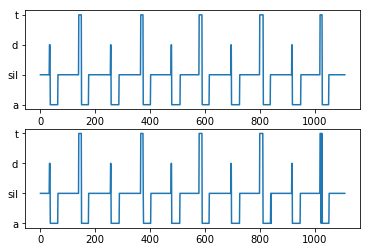

Epoch = 242 / 500 Cost =  0.02491


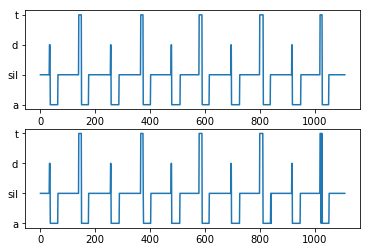

Epoch = 243 / 500 Cost =  0.02476


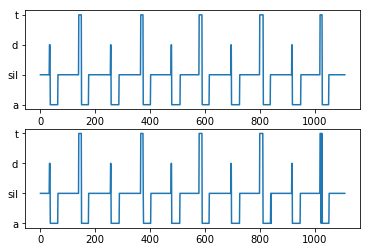

Epoch = 244 / 500 Cost =  0.02462


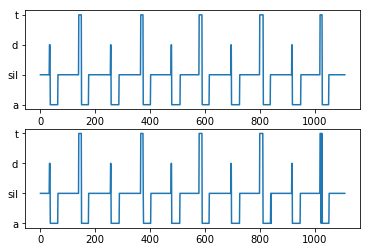

Epoch = 245 / 500 Cost =  0.02448


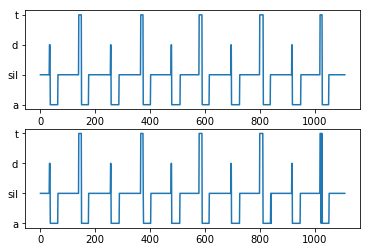

Epoch = 246 / 500 Cost =  0.02434


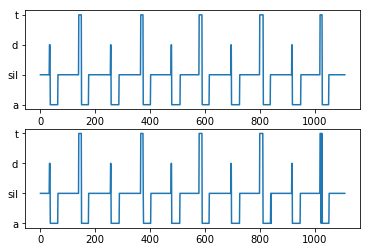

Epoch = 247 / 500 Cost =  0.02420


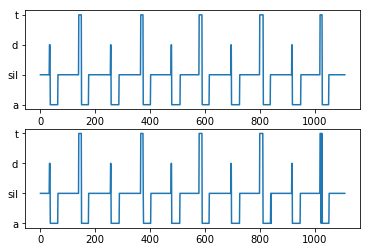

Epoch = 248 / 500 Cost =  0.02406


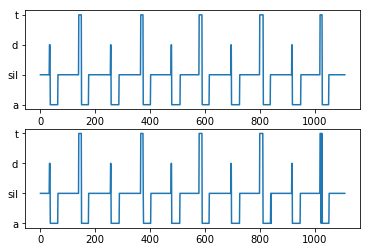

Epoch = 249 / 500 Cost =  0.02393


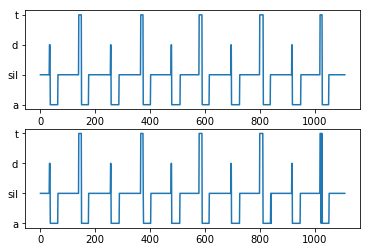

Epoch = 250 / 500 Cost =  0.02379


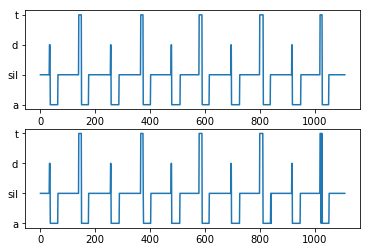

Epoch = 251 / 500 Cost =  0.02366


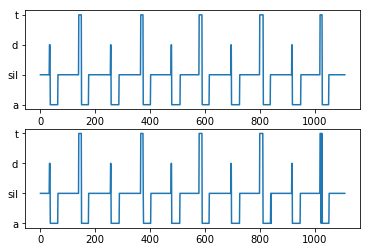

Epoch = 252 / 500 Cost =  0.02353


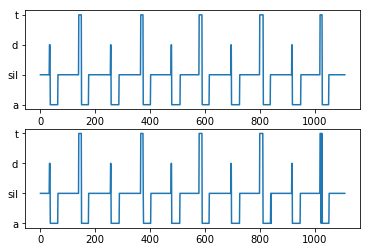

Epoch = 253 / 500 Cost =  0.02340


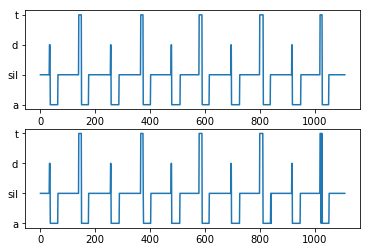

Epoch = 254 / 500 Cost =  0.02327


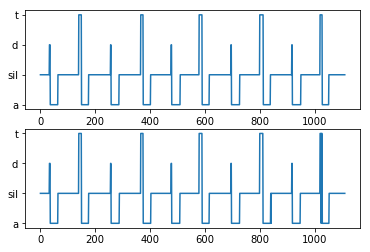

Epoch = 255 / 500 Cost =  0.02314


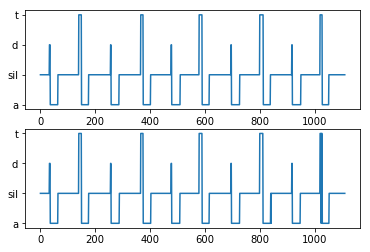

Epoch = 256 / 500 Cost =  0.02301


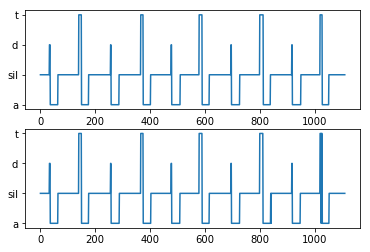

Epoch = 257 / 500 Cost =  0.02288


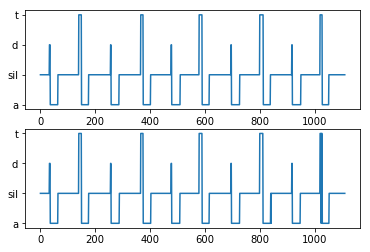

Epoch = 258 / 500 Cost =  0.02276


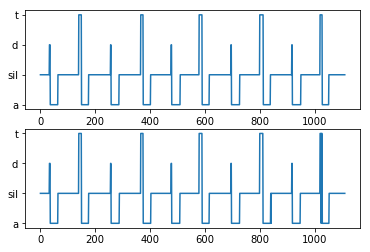

Epoch = 259 / 500 Cost =  0.02264


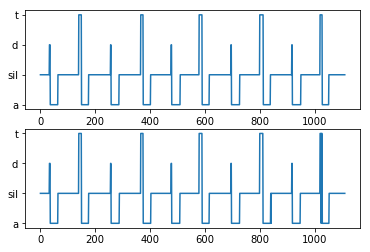

Epoch = 260 / 500 Cost =  0.02251


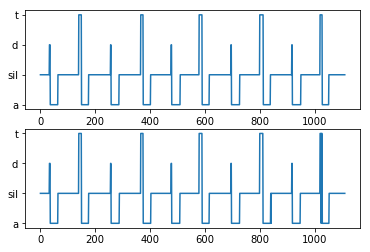

Epoch = 261 / 500 Cost =  0.02239


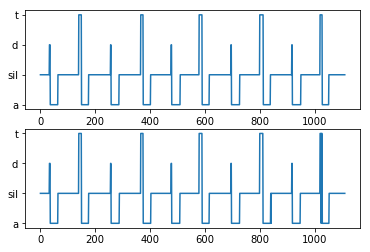

Epoch = 262 / 500 Cost =  0.02227


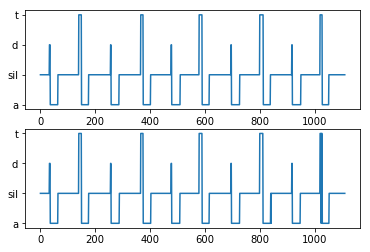

Epoch = 263 / 500 Cost =  0.02215


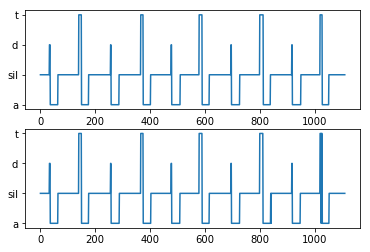

Epoch = 264 / 500 Cost =  0.02203


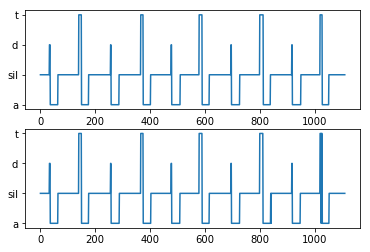

Epoch = 265 / 500 Cost =  0.02192


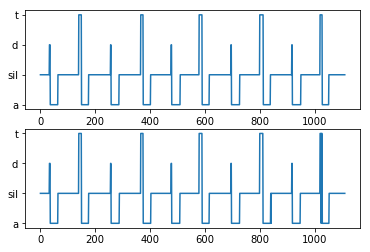

Epoch = 266 / 500 Cost =  0.02180


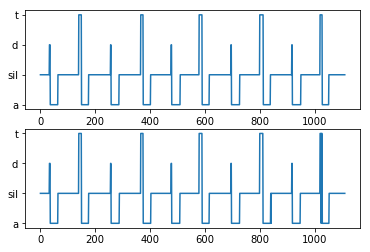

Epoch = 267 / 500 Cost =  0.02168


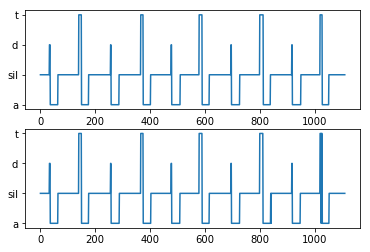

Epoch = 268 / 500 Cost =  0.02157


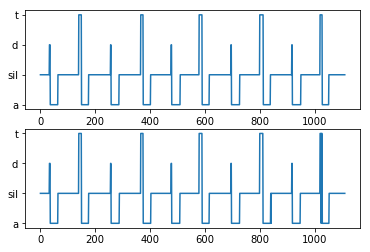

Epoch = 269 / 500 Cost =  0.02146


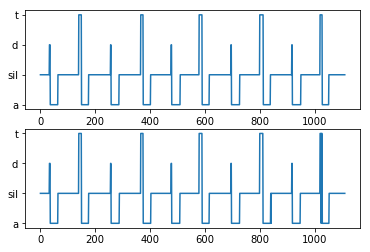

Epoch = 270 / 500 Cost =  0.02134


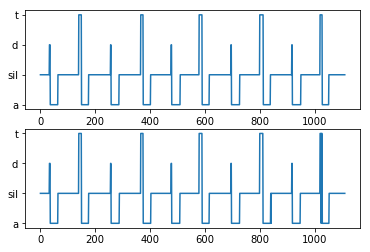

Epoch = 271 / 500 Cost =  0.02123


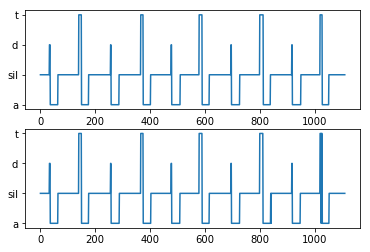

Epoch = 272 / 500 Cost =  0.02112


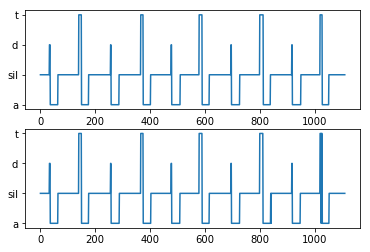

Epoch = 273 / 500 Cost =  0.02101


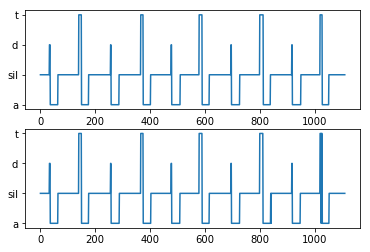

Epoch = 274 / 500 Cost =  0.02090


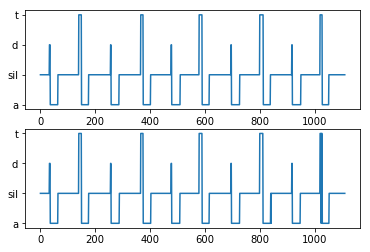

Epoch = 275 / 500 Cost =  0.02079


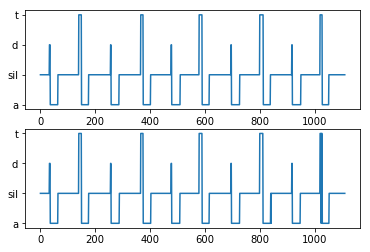

Epoch = 276 / 500 Cost =  0.02069


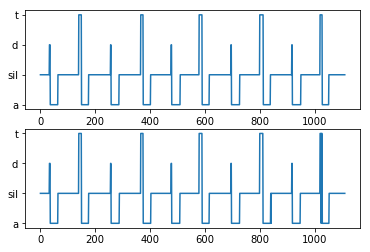

Epoch = 277 / 500 Cost =  0.02058


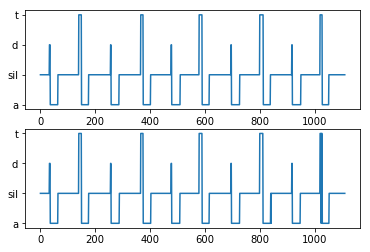

Epoch = 278 / 500 Cost =  0.02048


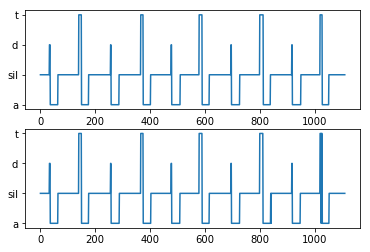

Epoch = 279 / 500 Cost =  0.02037


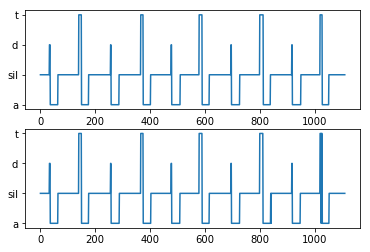

Epoch = 280 / 500 Cost =  0.02027


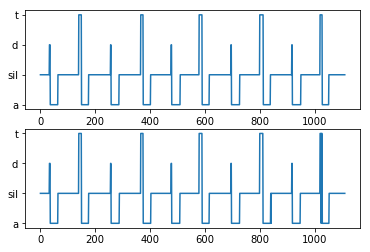

Epoch = 281 / 500 Cost =  0.02016


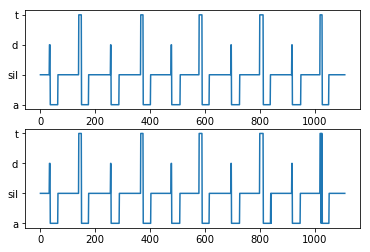

Epoch = 282 / 500 Cost =  0.02006


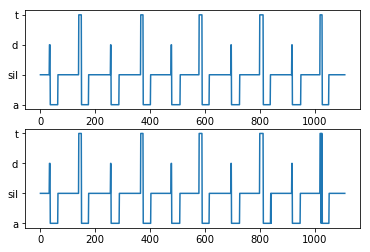

Epoch = 283 / 500 Cost =  0.01996


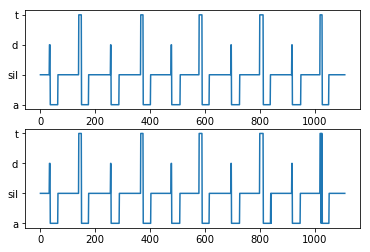

Epoch = 284 / 500 Cost =  0.01986


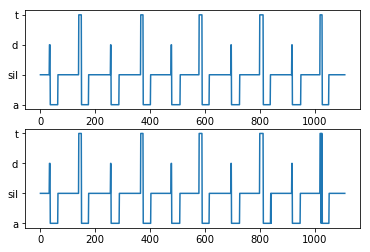

Epoch = 285 / 500 Cost =  0.01976


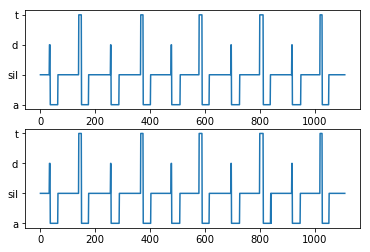

Epoch = 286 / 500 Cost =  0.01966


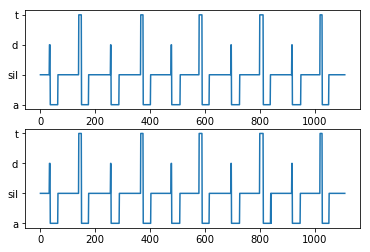

Epoch = 287 / 500 Cost =  0.01956


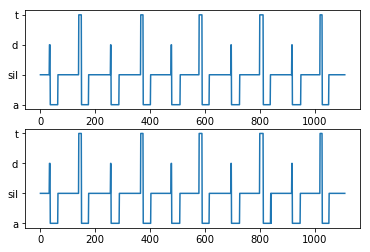

Epoch = 288 / 500 Cost =  0.01947


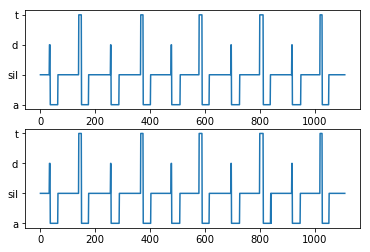

Epoch = 289 / 500 Cost =  0.01937


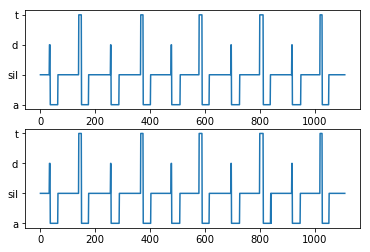

Epoch = 290 / 500 Cost =  0.01928


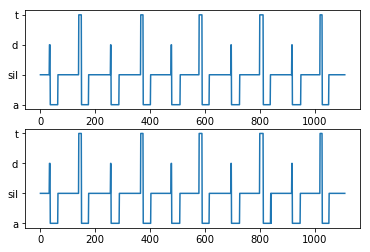

Epoch = 291 / 500 Cost =  0.01918


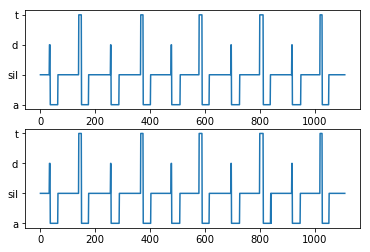

Epoch = 292 / 500 Cost =  0.01909


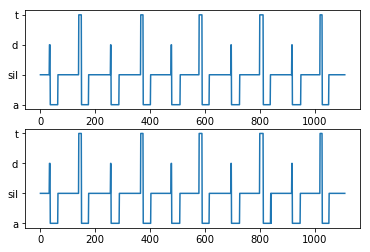

Epoch = 293 / 500 Cost =  0.01899


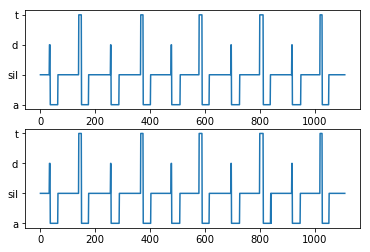

Epoch = 294 / 500 Cost =  0.01890


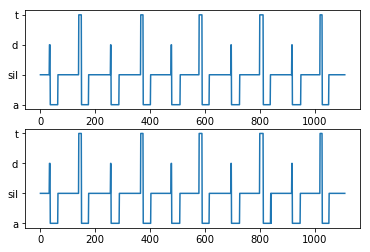

Epoch = 295 / 500 Cost =  0.01881


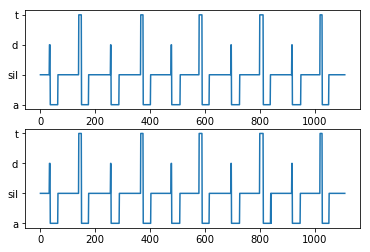

Epoch = 296 / 500 Cost =  0.01872


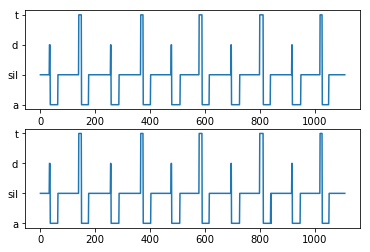

Epoch = 297 / 500 Cost =  0.01863


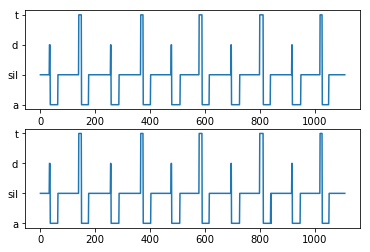

Epoch = 298 / 500 Cost =  0.01854


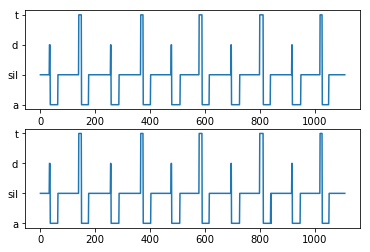

Epoch = 299 / 500 Cost =  0.01845


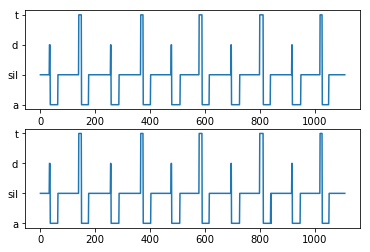

Epoch = 300 / 500 Cost =  0.01836


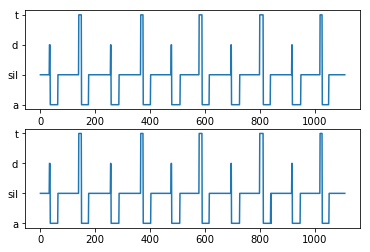

Epoch = 301 / 500 Cost =  0.01827


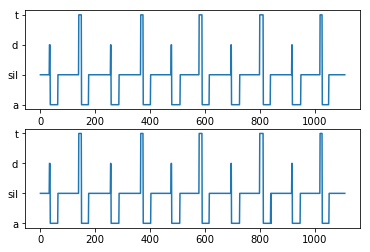

Epoch = 302 / 500 Cost =  0.01818


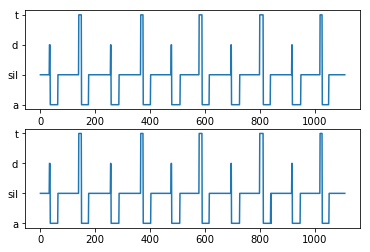

Epoch = 303 / 500 Cost =  0.01810


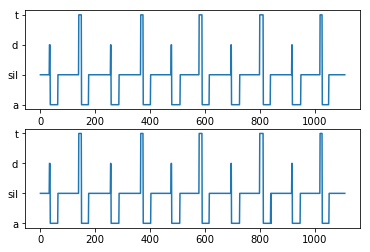

Epoch = 304 / 500 Cost =  0.01801


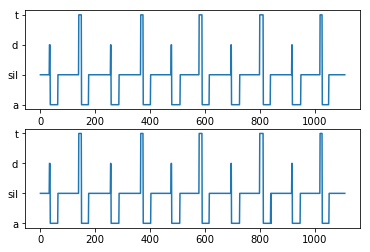

Epoch = 305 / 500 Cost =  0.01793


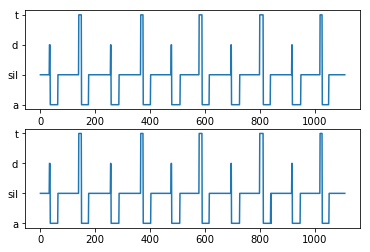

Epoch = 306 / 500 Cost =  0.01784


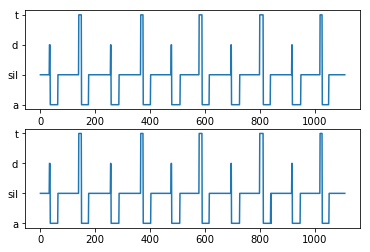

Epoch = 307 / 500 Cost =  0.01776


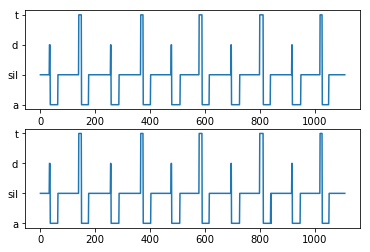

Epoch = 308 / 500 Cost =  0.01767


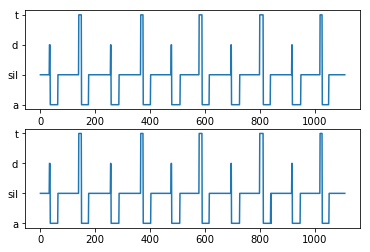

Epoch = 309 / 500 Cost =  0.01759


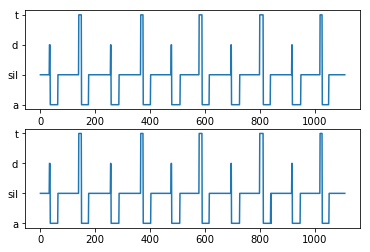

Epoch = 310 / 500 Cost =  0.01751


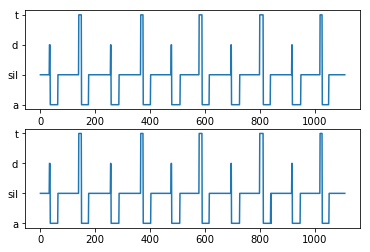

Epoch = 311 / 500 Cost =  0.01743


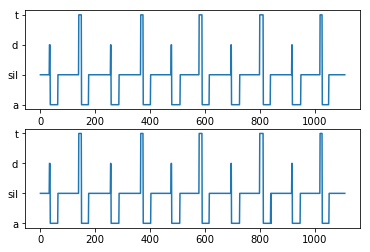

Epoch = 312 / 500 Cost =  0.01734


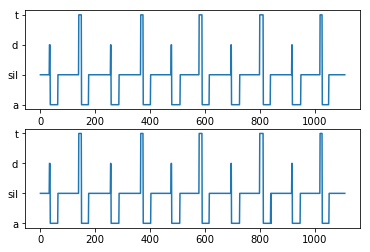

Epoch = 313 / 500 Cost =  0.01726


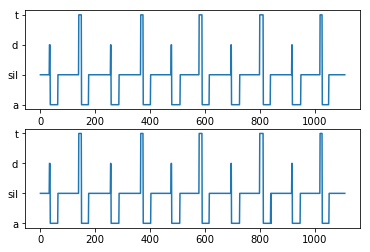

Epoch = 314 / 500 Cost =  0.01718


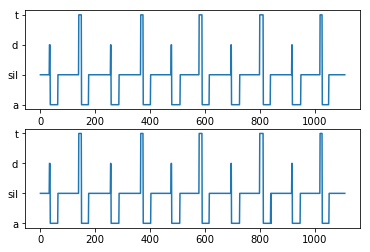

Epoch = 315 / 500 Cost =  0.01710


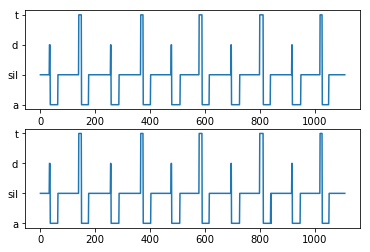

Epoch = 316 / 500 Cost =  0.01703


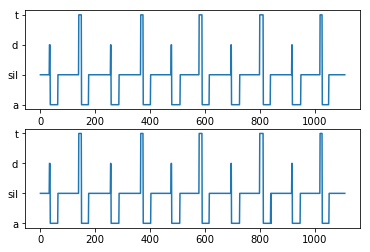

Epoch = 317 / 500 Cost =  0.01695


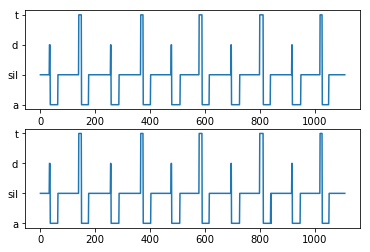

Epoch = 318 / 500 Cost =  0.01687


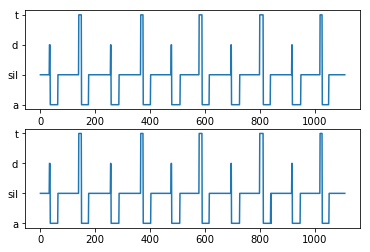

Epoch = 319 / 500 Cost =  0.01679


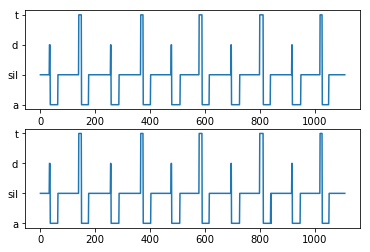

Epoch = 320 / 500 Cost =  0.01672


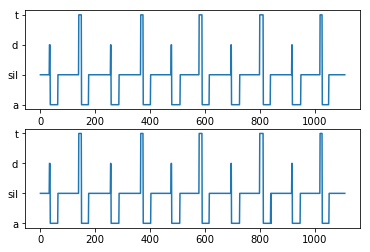

Epoch = 321 / 500 Cost =  0.01664


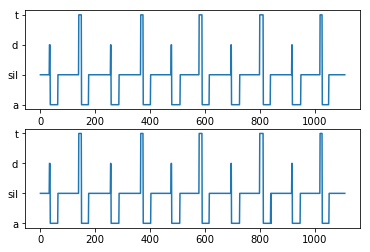

Epoch = 322 / 500 Cost =  0.01656


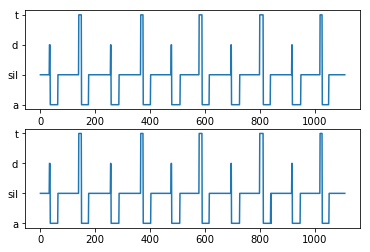

Epoch = 323 / 500 Cost =  0.01649


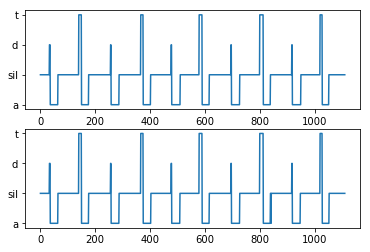

Epoch = 324 / 500 Cost =  0.01641


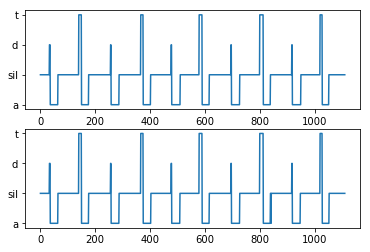

Epoch = 325 / 500 Cost =  0.01634


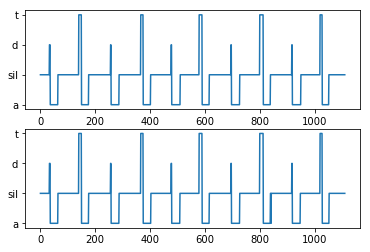

Epoch = 326 / 500 Cost =  0.01627


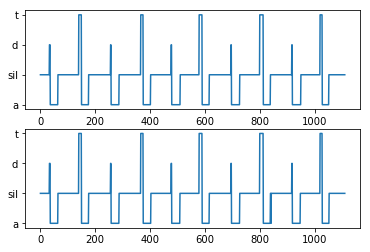

Epoch = 327 / 500 Cost =  0.01619


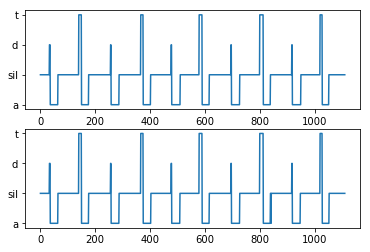

Epoch = 328 / 500 Cost =  0.01612


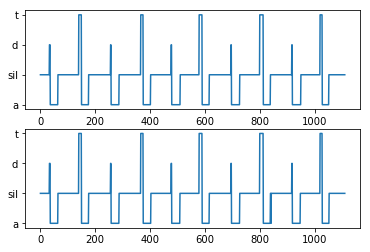

Epoch = 329 / 500 Cost =  0.01605


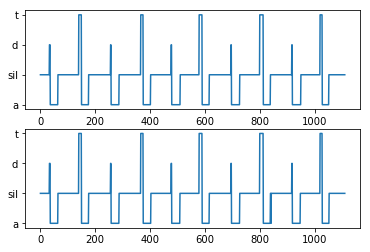

Epoch = 330 / 500 Cost =  0.01598


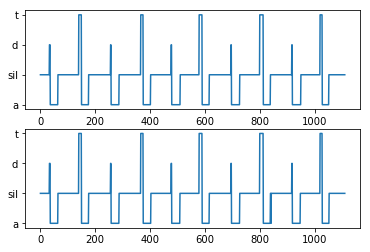

Epoch = 331 / 500 Cost =  0.01591


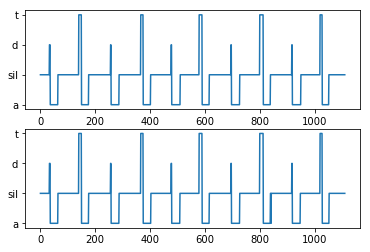

Epoch = 332 / 500 Cost =  0.01583


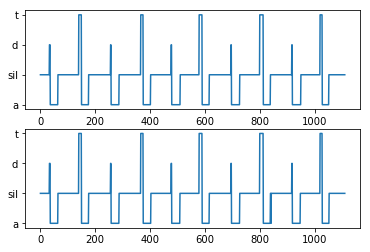

Epoch = 333 / 500 Cost =  0.01576


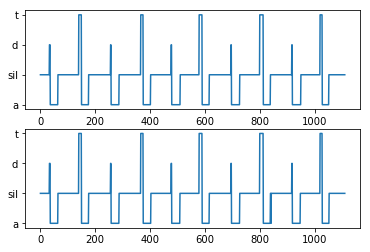

Epoch = 334 / 500 Cost =  0.01569


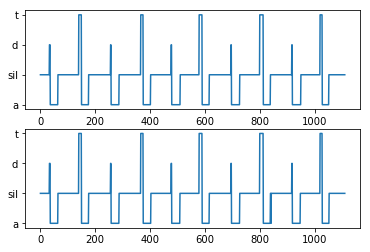

Epoch = 335 / 500 Cost =  0.01563


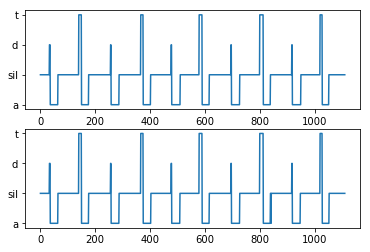

Epoch = 336 / 500 Cost =  0.01556


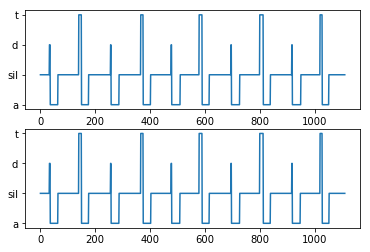

Epoch = 337 / 500 Cost =  0.01549


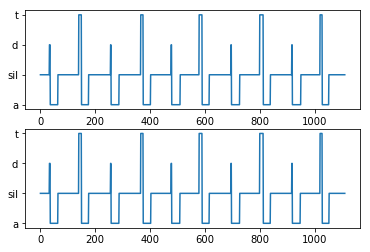

Epoch = 338 / 500 Cost =  0.01542


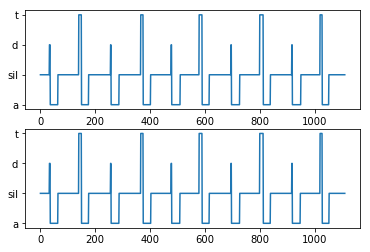

Epoch = 339 / 500 Cost =  0.01535


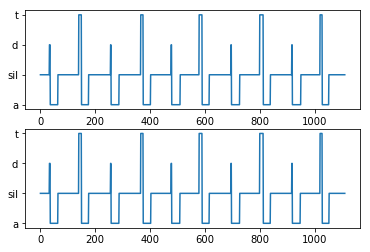

Epoch = 340 / 500 Cost =  0.01529


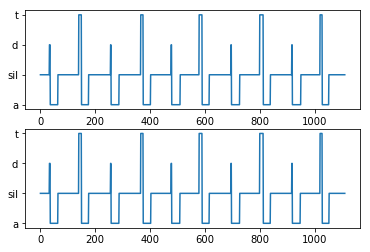

Epoch = 341 / 500 Cost =  0.01522


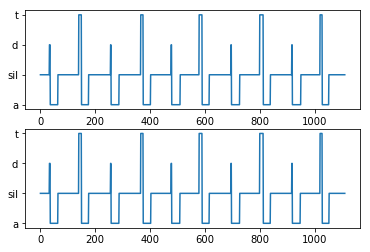

Epoch = 342 / 500 Cost =  0.01515


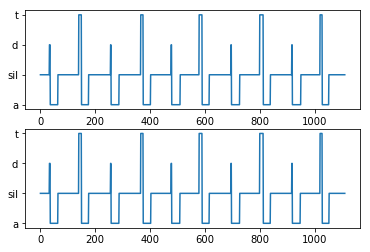

Epoch = 343 / 500 Cost =  0.01509


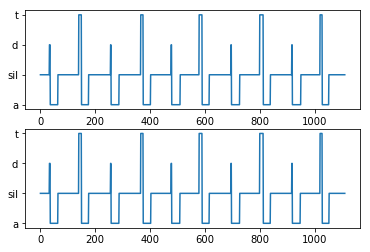

Epoch = 344 / 500 Cost =  0.01502


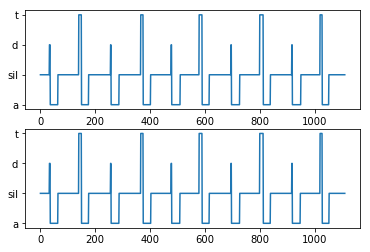

Epoch = 345 / 500 Cost =  0.01496


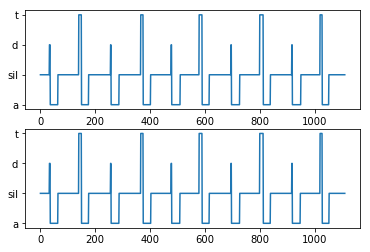

Epoch = 346 / 500 Cost =  0.01489


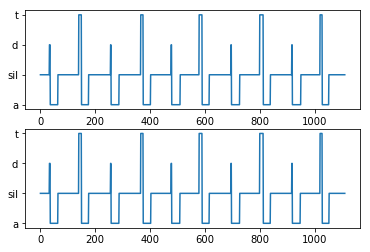

Epoch = 347 / 500 Cost =  0.01483


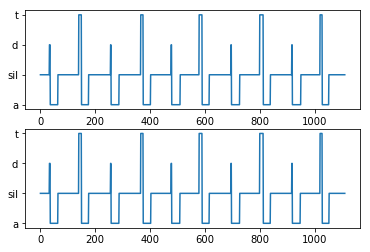

Epoch = 348 / 500 Cost =  0.01476


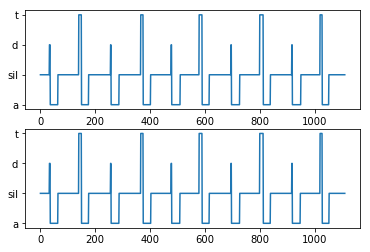

Epoch = 349 / 500 Cost =  0.01470


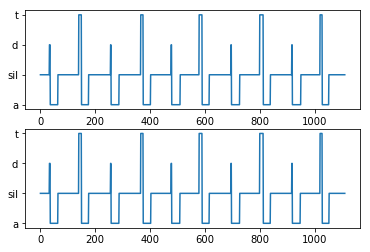

Epoch = 350 / 500 Cost =  0.01464


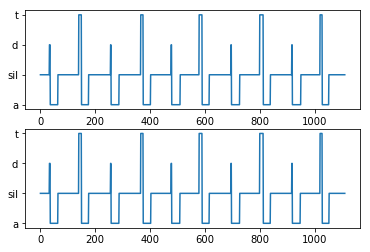

Epoch = 351 / 500 Cost =  0.01457


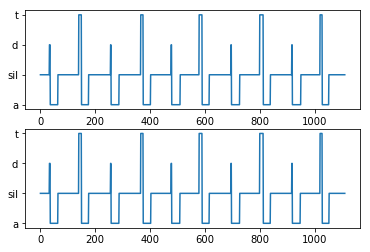

Epoch = 352 / 500 Cost =  0.01451


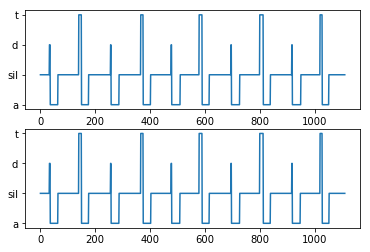

Epoch = 353 / 500 Cost =  0.01445


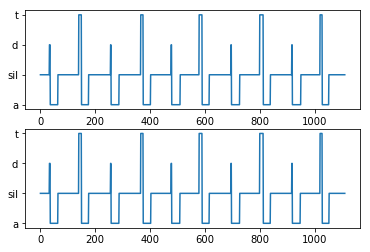

Epoch = 354 / 500 Cost =  0.01439


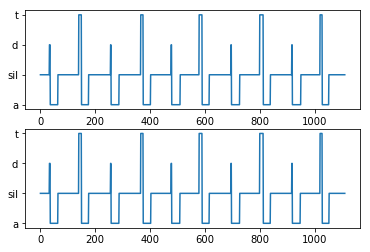

Epoch = 355 / 500 Cost =  0.01433


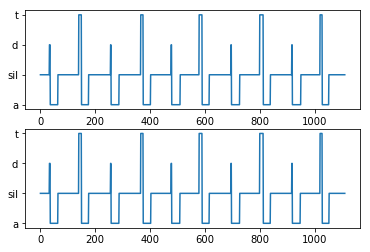

Epoch = 356 / 500 Cost =  0.01427


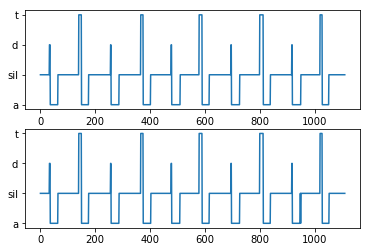

Epoch = 357 / 500 Cost =  0.01421


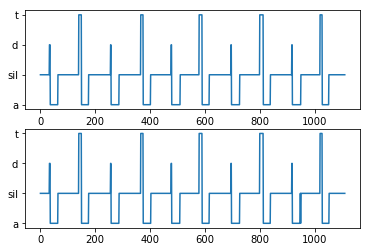

Epoch = 358 / 500 Cost =  0.01415


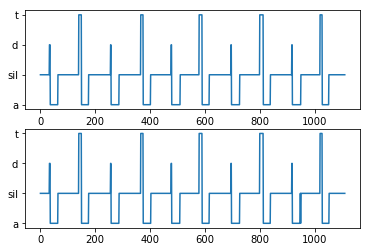

Epoch = 359 / 500 Cost =  0.01409


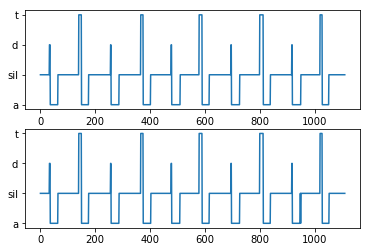

Epoch = 360 / 500 Cost =  0.01403


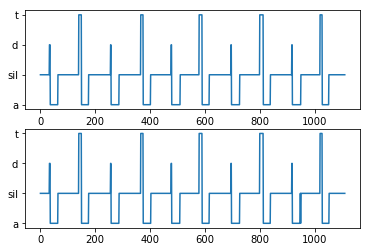

Epoch = 361 / 500 Cost =  0.01397


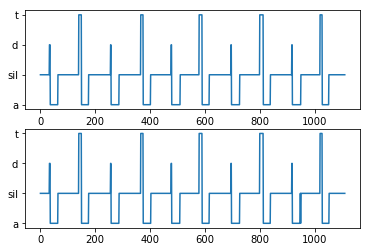

Epoch = 362 / 500 Cost =  0.01391


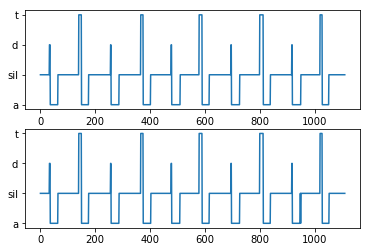

Epoch = 363 / 500 Cost =  0.01385


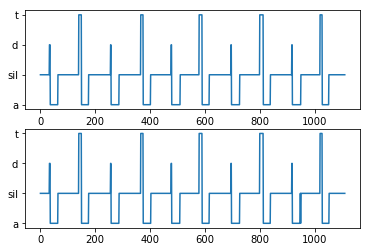

Epoch = 364 / 500 Cost =  0.01379


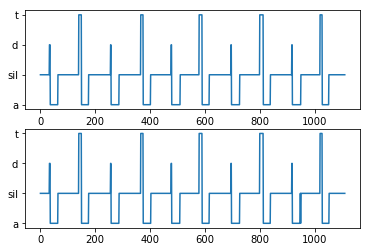

Epoch = 365 / 500 Cost =  0.01374


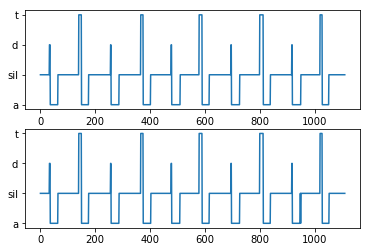

Epoch = 366 / 500 Cost =  0.01368


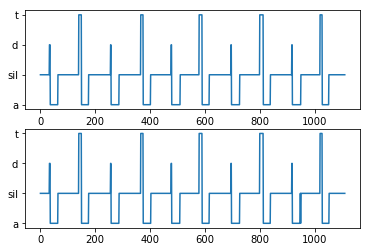

Epoch = 367 / 500 Cost =  0.01362


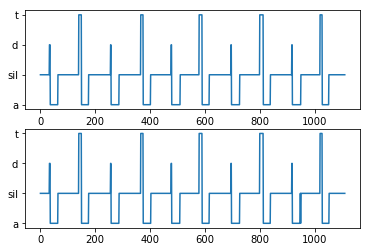

Epoch = 368 / 500 Cost =  0.01357


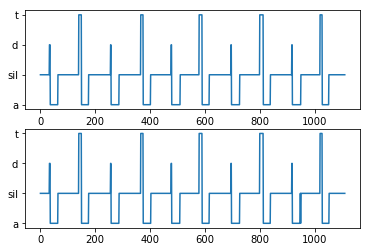

Epoch = 369 / 500 Cost =  0.01351


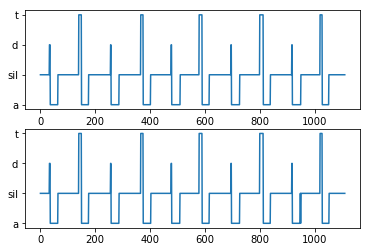

Epoch = 370 / 500 Cost =  0.01345


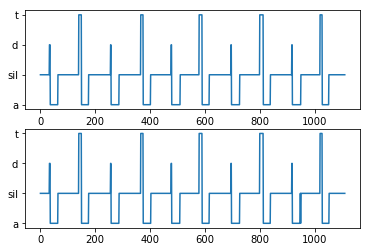

Epoch = 371 / 500 Cost =  0.01340


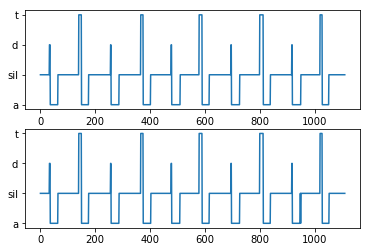

Epoch = 372 / 500 Cost =  0.01334


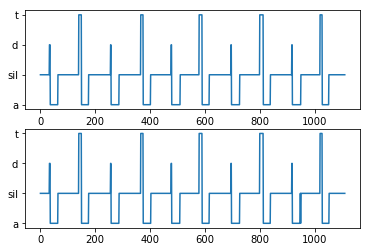

Epoch = 373 / 500 Cost =  0.01329


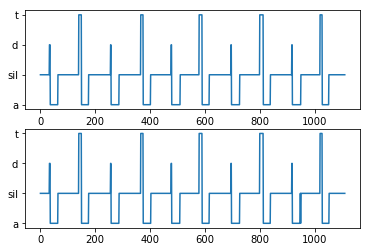

Epoch = 374 / 500 Cost =  0.01323


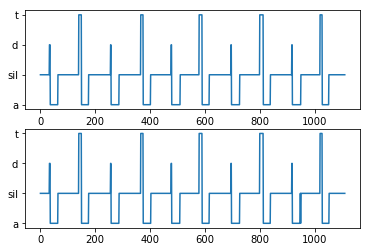

Epoch = 375 / 500 Cost =  0.01318


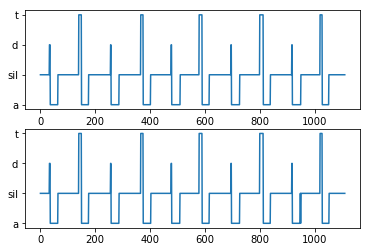

Epoch = 376 / 500 Cost =  0.01313


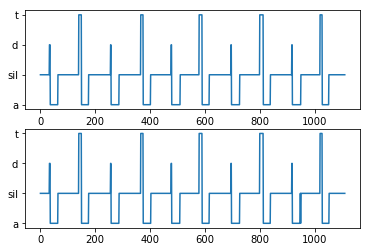

Epoch = 377 / 500 Cost =  0.01307


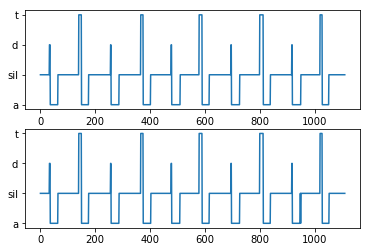

Epoch = 378 / 500 Cost =  0.01302


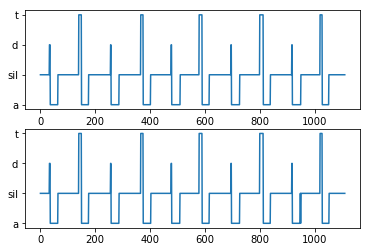

Epoch = 379 / 500 Cost =  0.01297


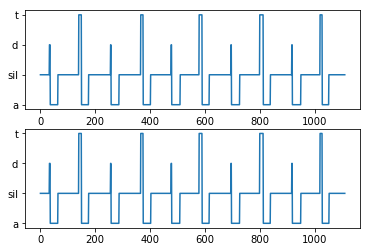

Epoch = 380 / 500 Cost =  0.01291


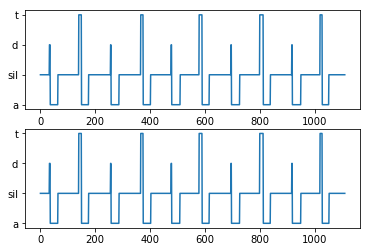

Epoch = 381 / 500 Cost =  0.01286


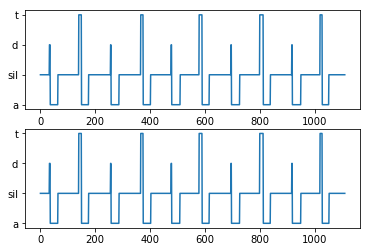

Epoch = 382 / 500 Cost =  0.01281


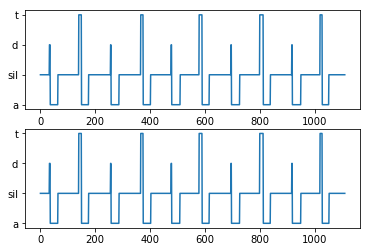

Epoch = 383 / 500 Cost =  0.01276


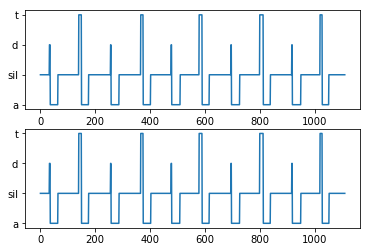

Epoch = 384 / 500 Cost =  0.01271


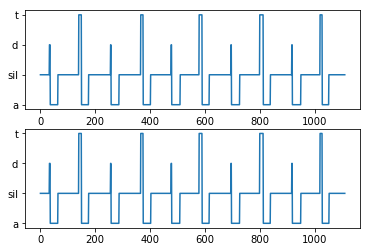

Epoch = 385 / 500 Cost =  0.01266


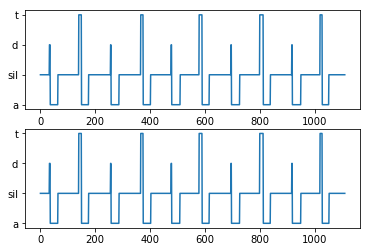

Epoch = 386 / 500 Cost =  0.01260


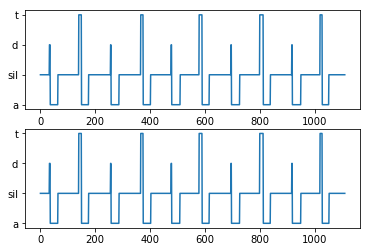

Epoch = 387 / 500 Cost =  0.01255


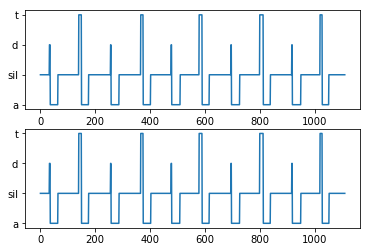

Epoch = 388 / 500 Cost =  0.01250


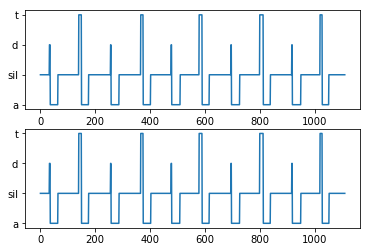

Epoch = 389 / 500 Cost =  0.01245


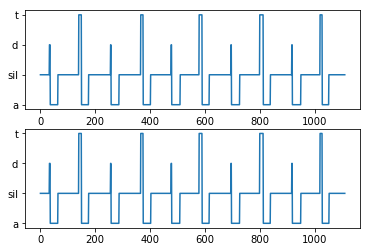

Epoch = 390 / 500 Cost =  0.01240


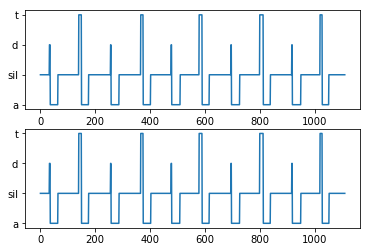

Epoch = 391 / 500 Cost =  0.01235


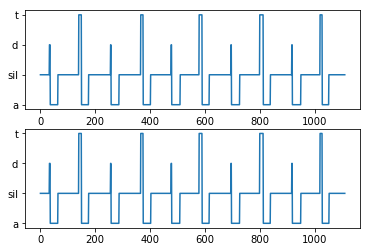

Epoch = 392 / 500 Cost =  0.01231


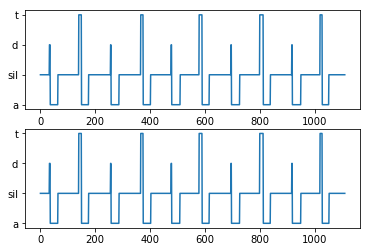

Epoch = 393 / 500 Cost =  0.01226


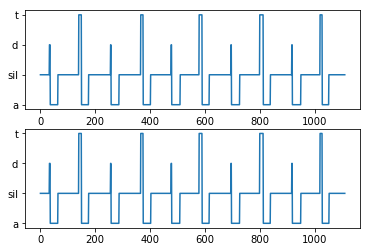

Epoch = 394 / 500 Cost =  0.01221


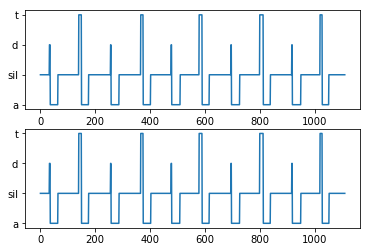

Epoch = 395 / 500 Cost =  0.01216


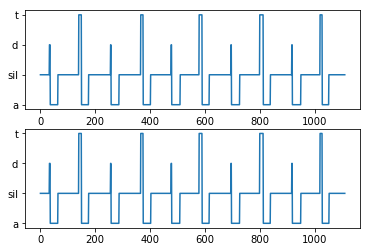

Epoch = 396 / 500 Cost =  0.01211


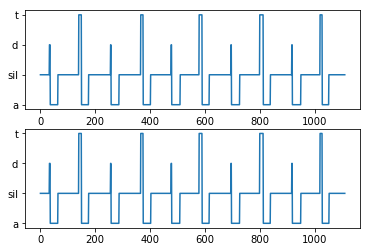

Epoch = 397 / 500 Cost =  0.01206


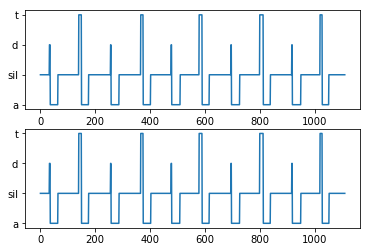

Epoch = 398 / 500 Cost =  0.01202


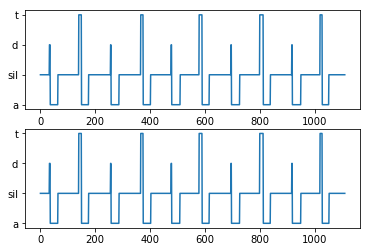

Epoch = 399 / 500 Cost =  0.01197


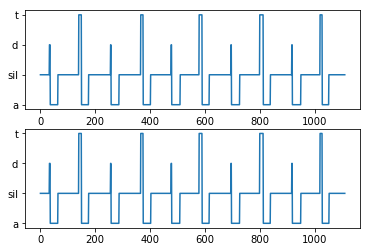

Epoch = 400 / 500 Cost =  0.01192


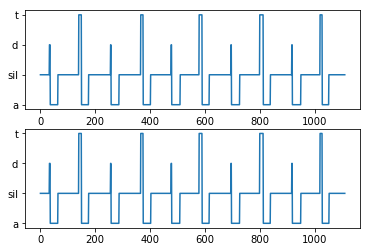

Epoch = 401 / 500 Cost =  0.01187


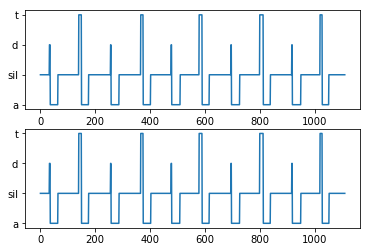

Epoch = 402 / 500 Cost =  0.01183


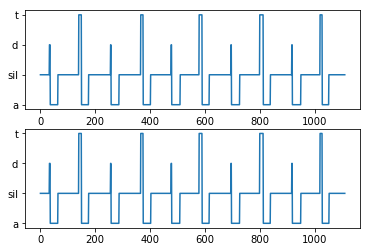

Epoch = 403 / 500 Cost =  0.01178


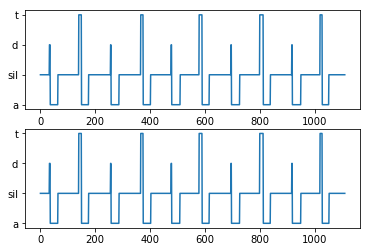

Epoch = 404 / 500 Cost =  0.01173


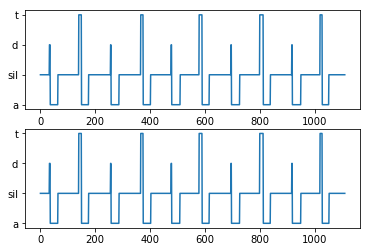

Epoch = 405 / 500 Cost =  0.01169


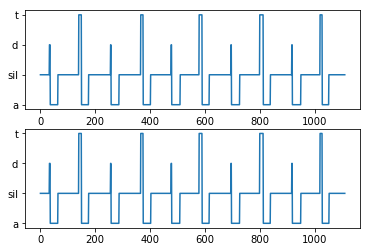

Epoch = 406 / 500 Cost =  0.01164


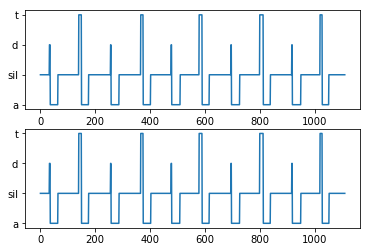

Epoch = 407 / 500 Cost =  0.01160


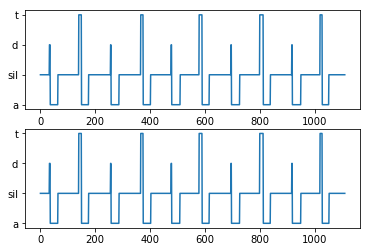

Epoch = 408 / 500 Cost =  0.01155


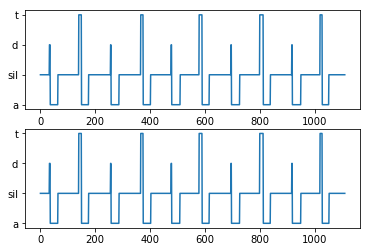

Epoch = 409 / 500 Cost =  0.01150


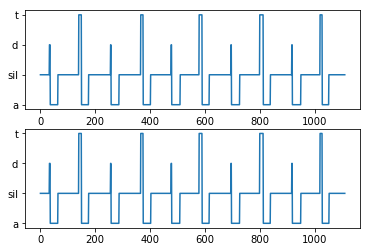

Epoch = 410 / 500 Cost =  0.01146


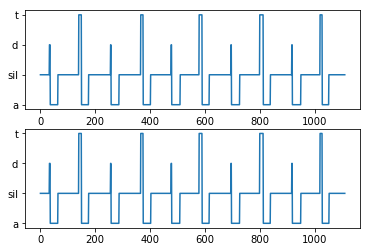

Epoch = 411 / 500 Cost =  0.01142


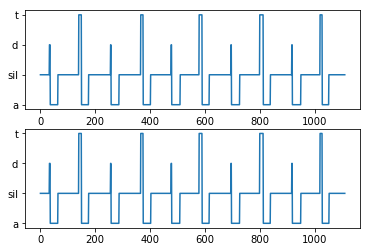

Epoch = 412 / 500 Cost =  0.01137


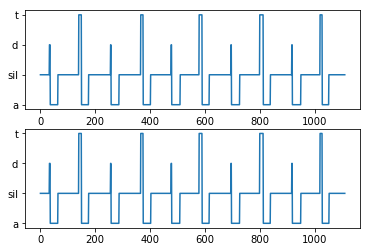

Epoch = 413 / 500 Cost =  0.01133


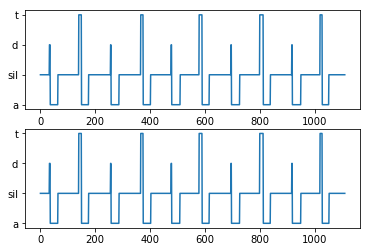

Epoch = 414 / 500 Cost =  0.01128


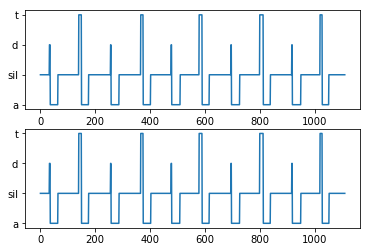

Epoch = 415 / 500 Cost =  0.01124


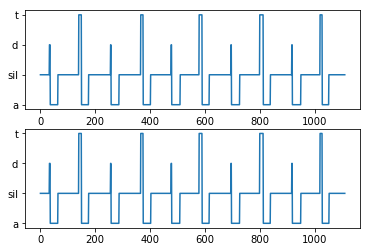

Epoch = 416 / 500 Cost =  0.01120


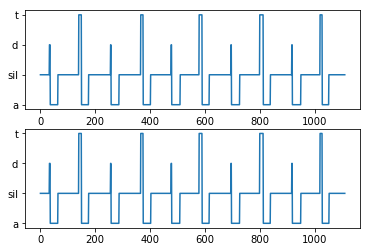

Epoch = 417 / 500 Cost =  0.01115


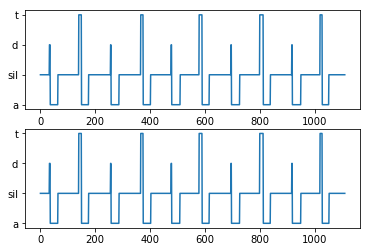

Epoch = 418 / 500 Cost =  0.01111


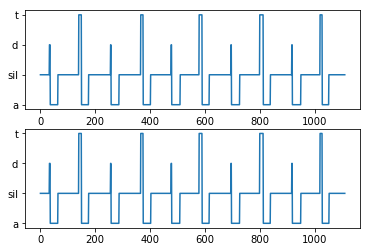

Epoch = 419 / 500 Cost =  0.01107


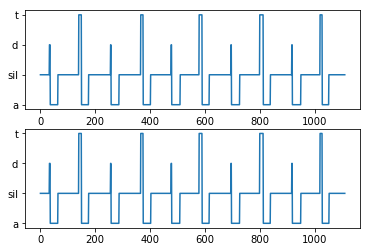

Epoch = 420 / 500 Cost =  0.01103


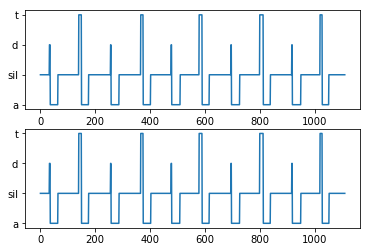

Epoch = 421 / 500 Cost =  0.01098


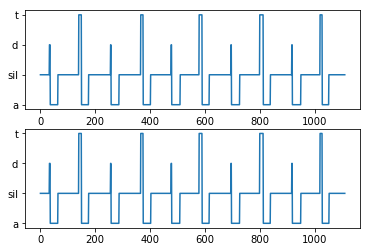

Epoch = 422 / 500 Cost =  0.01094


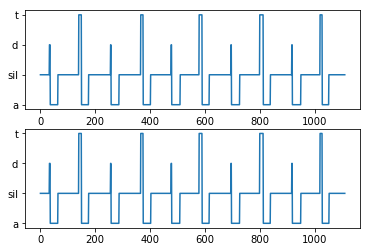

Epoch = 423 / 500 Cost =  0.01090


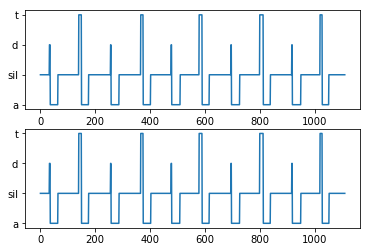

Epoch = 424 / 500 Cost =  0.01086


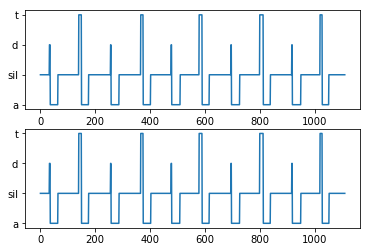

Epoch = 425 / 500 Cost =  0.01082


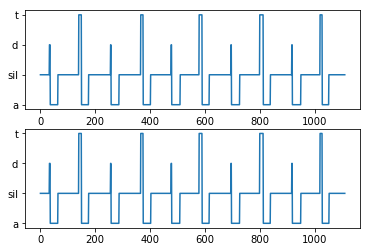

Epoch = 426 / 500 Cost =  0.01078


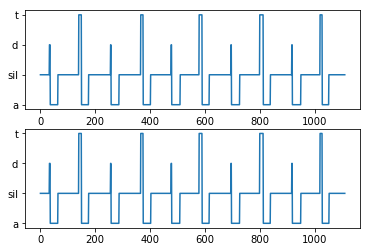

Epoch = 427 / 500 Cost =  0.01074


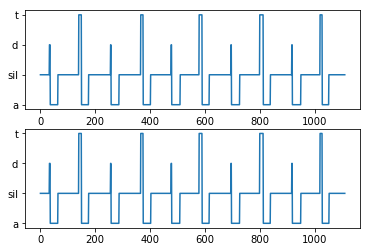

Epoch = 428 / 500 Cost =  0.01070


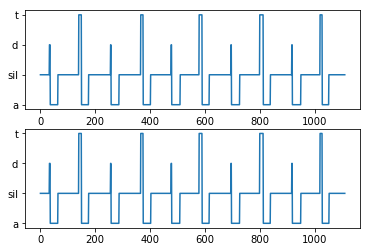

Epoch = 429 / 500 Cost =  0.01066


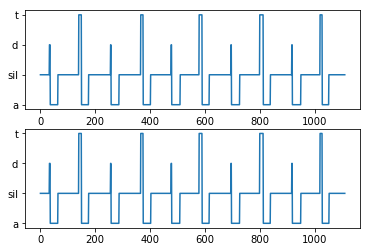

Epoch = 430 / 500 Cost =  0.01062


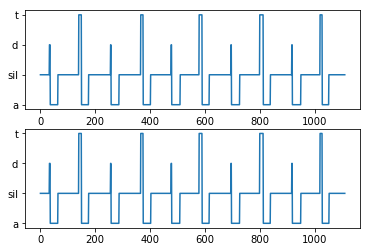

Epoch = 431 / 500 Cost =  0.01058


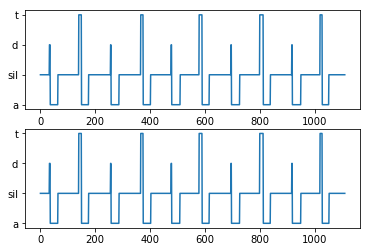

Epoch = 432 / 500 Cost =  0.01054


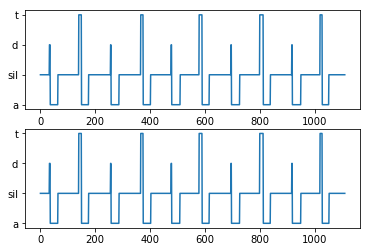

Epoch = 433 / 500 Cost =  0.01050


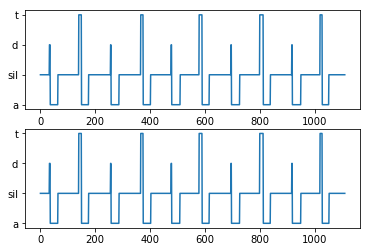

Epoch = 434 / 500 Cost =  0.01046


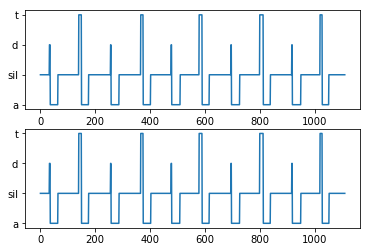

Epoch = 435 / 500 Cost =  0.01042


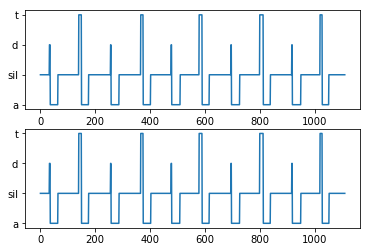

Epoch = 436 / 500 Cost =  0.01039


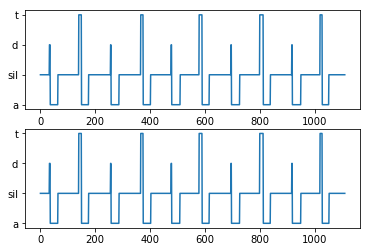

Epoch = 437 / 500 Cost =  0.01035


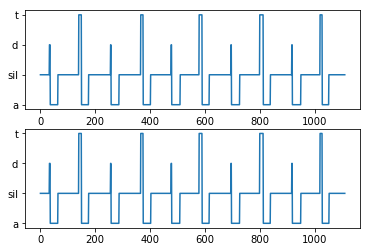

Epoch = 438 / 500 Cost =  0.01031


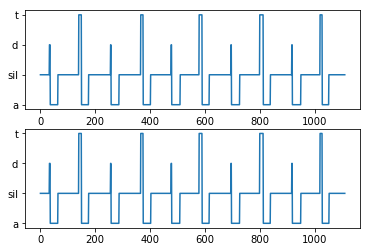

Epoch = 439 / 500 Cost =  0.01027


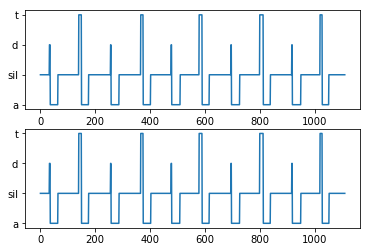

Epoch = 440 / 500 Cost =  0.01024


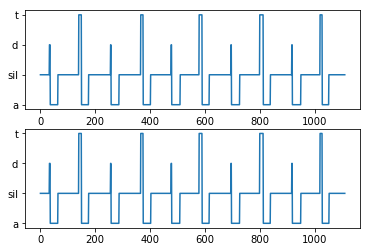

Epoch = 441 / 500 Cost =  0.01020


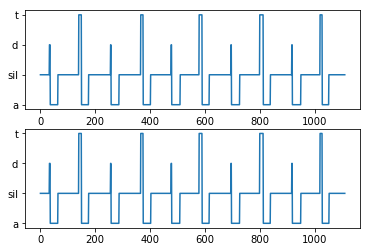

Epoch = 442 / 500 Cost =  0.01016


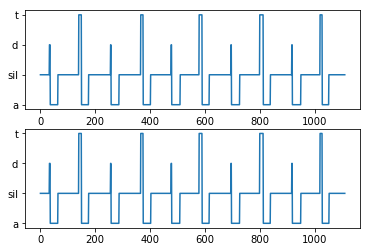

Epoch = 443 / 500 Cost =  0.01013


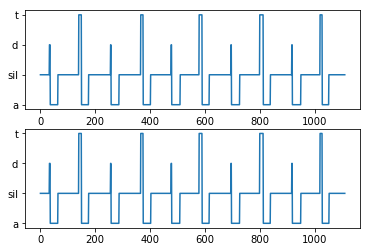

Epoch = 444 / 500 Cost =  0.01009


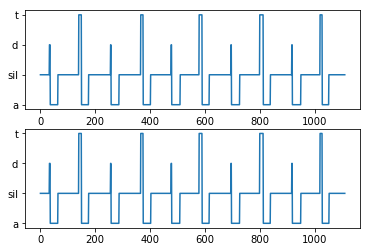

Epoch = 445 / 500 Cost =  0.01005


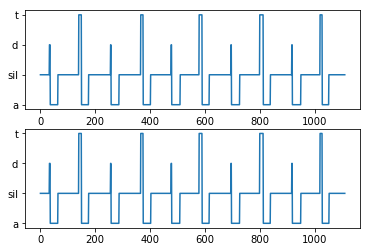

Epoch = 446 / 500 Cost =  0.01002


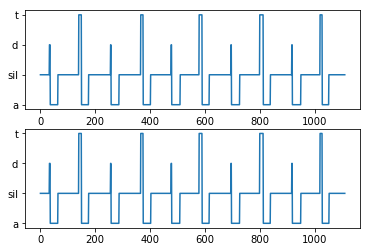

Epoch = 447 / 500 Cost =  0.00998


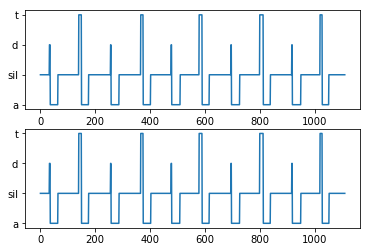

Epoch = 448 / 500 Cost =  0.00995


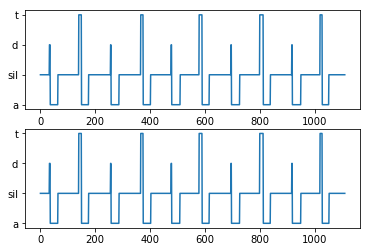

Epoch = 449 / 500 Cost =  0.00991


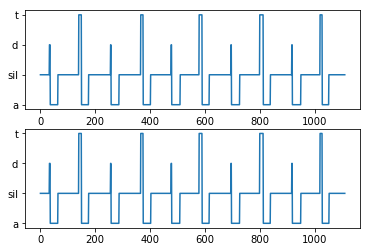

Epoch = 450 / 500 Cost =  0.00988


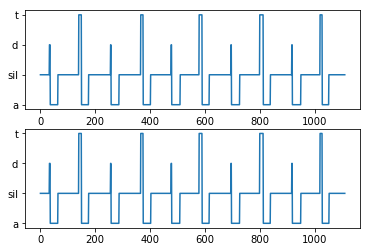

Epoch = 451 / 500 Cost =  0.00984


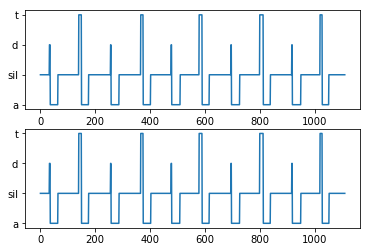

Epoch = 452 / 500 Cost =  0.00981


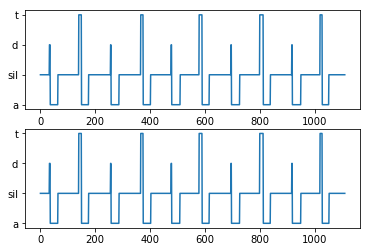

Epoch = 453 / 500 Cost =  0.00977


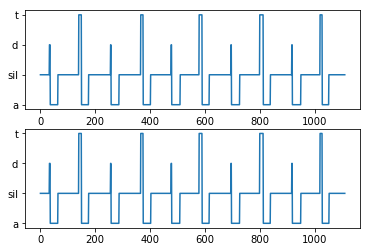

Epoch = 454 / 500 Cost =  0.00974


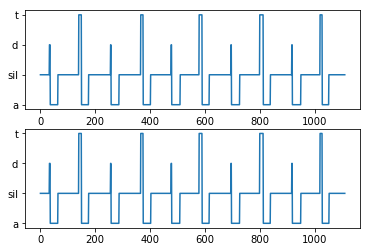

Epoch = 455 / 500 Cost =  0.00970


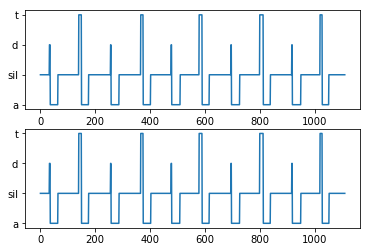

Epoch = 456 / 500 Cost =  0.00967


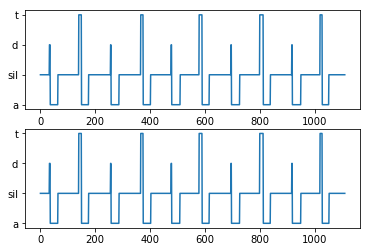

Epoch = 457 / 500 Cost =  0.00964


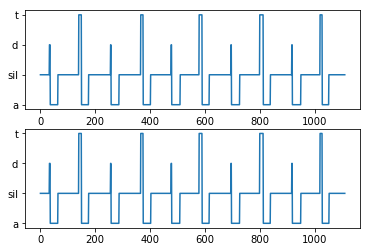

Epoch = 458 / 500 Cost =  0.00960


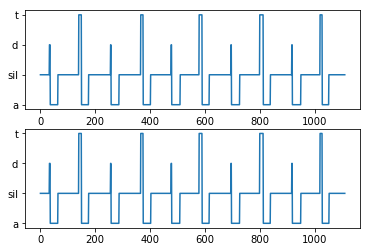

Epoch = 459 / 500 Cost =  0.00957


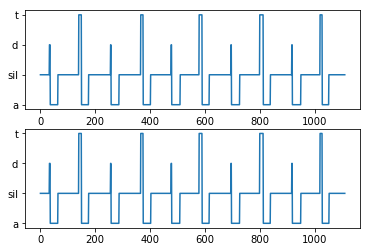

Epoch = 460 / 500 Cost =  0.00954


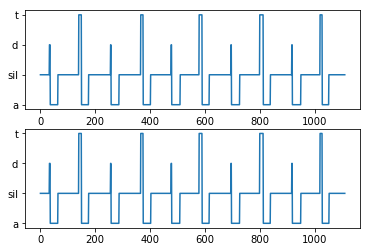

Epoch = 461 / 500 Cost =  0.00950


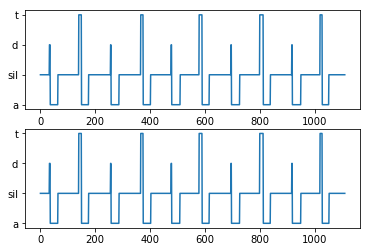

Epoch = 462 / 500 Cost =  0.00947


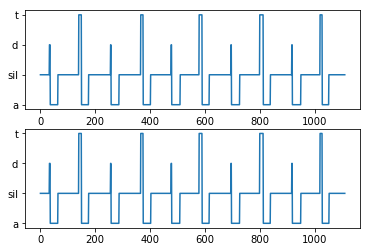

Epoch = 463 / 500 Cost =  0.00944


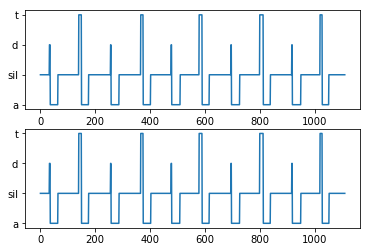

Epoch = 464 / 500 Cost =  0.00940


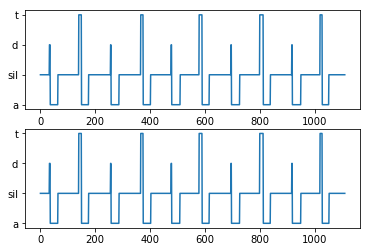

Epoch = 465 / 500 Cost =  0.00937


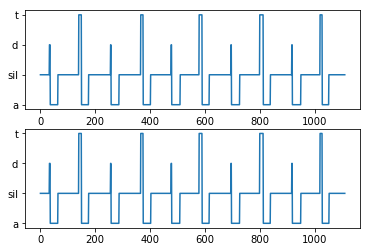

Epoch = 466 / 500 Cost =  0.00934


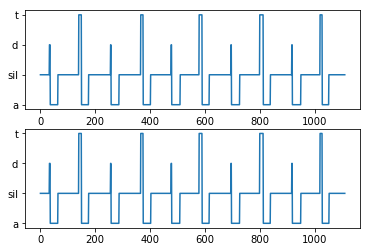

Epoch = 467 / 500 Cost =  0.00931


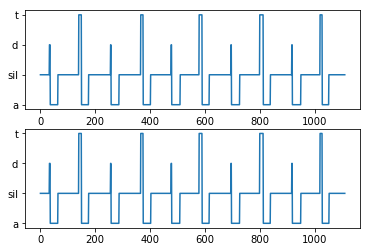

Epoch = 468 / 500 Cost =  0.00928


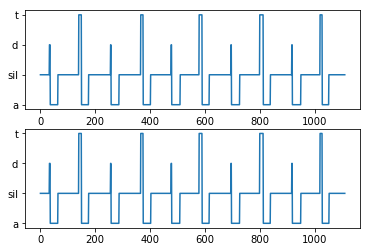

Epoch = 469 / 500 Cost =  0.00924


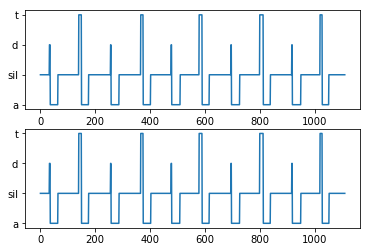

Epoch = 470 / 500 Cost =  0.00921


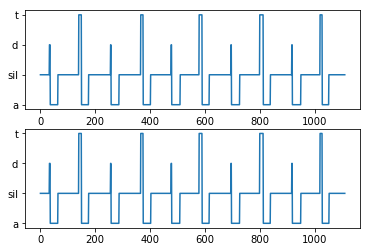

Epoch = 471 / 500 Cost =  0.00918


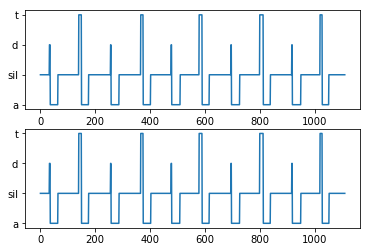

Epoch = 472 / 500 Cost =  0.00915


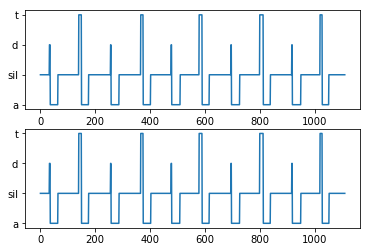

Epoch = 473 / 500 Cost =  0.00912


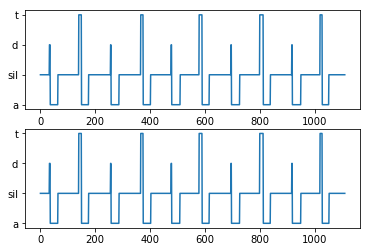

Epoch = 474 / 500 Cost =  0.00909


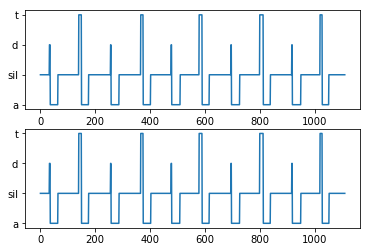

Epoch = 475 / 500 Cost =  0.00906


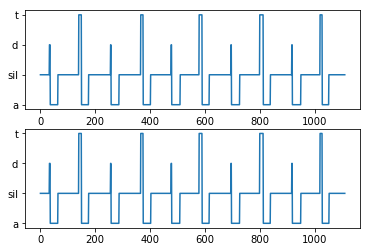

Epoch = 476 / 500 Cost =  0.00903


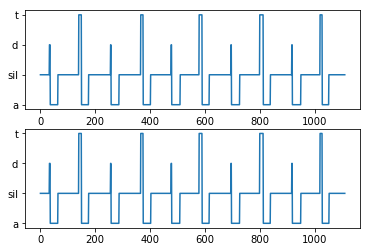

Epoch = 477 / 500 Cost =  0.00900


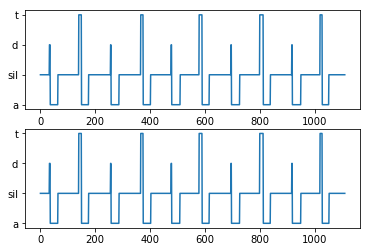

Epoch = 478 / 500 Cost =  0.00897


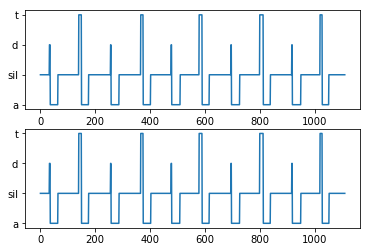

Epoch = 479 / 500 Cost =  0.00894


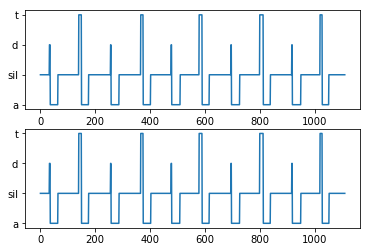

Epoch = 480 / 500 Cost =  0.00891


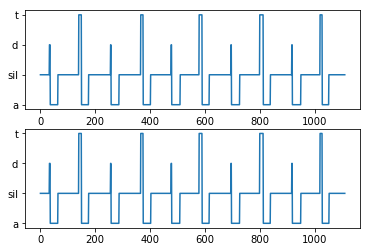

Epoch = 481 / 500 Cost =  0.00888


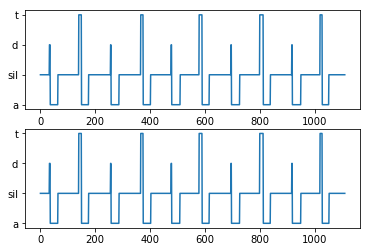

Epoch = 482 / 500 Cost =  0.00885


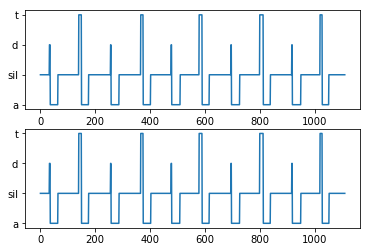

Epoch = 483 / 500 Cost =  0.00882


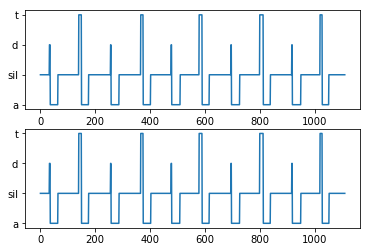

Epoch = 484 / 500 Cost =  0.00879


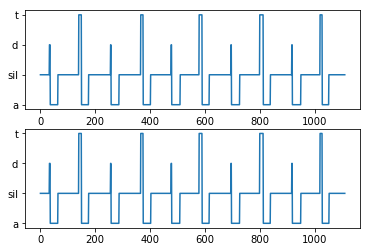

Epoch = 485 / 500 Cost =  0.00876


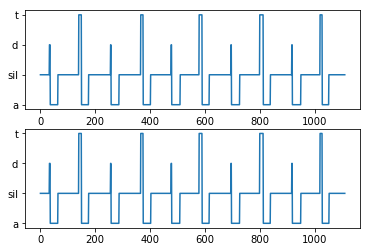

Epoch = 486 / 500 Cost =  0.00873


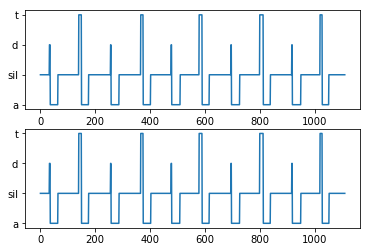

Epoch = 487 / 500 Cost =  0.00870


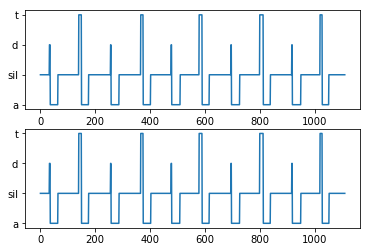

Epoch = 488 / 500 Cost =  0.00868


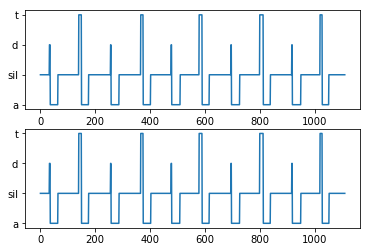

Epoch = 489 / 500 Cost =  0.00865


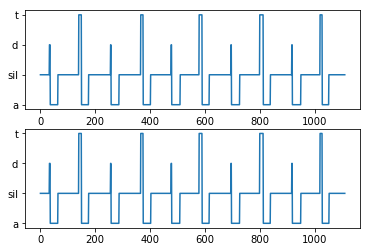

Epoch = 490 / 500 Cost =  0.00862


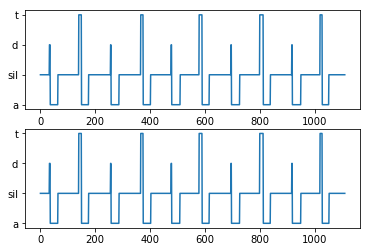

Epoch = 491 / 500 Cost =  0.00859


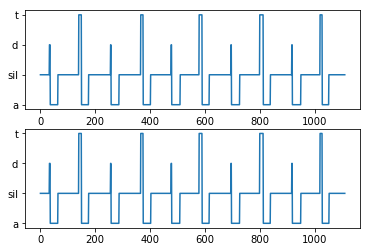

Epoch = 492 / 500 Cost =  0.00856


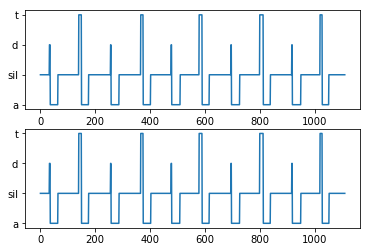

Epoch = 493 / 500 Cost =  0.00853


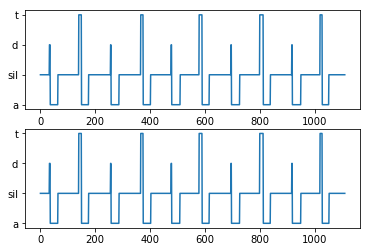

Epoch = 494 / 500 Cost =  0.00851


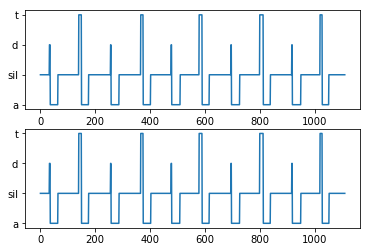

Epoch = 495 / 500 Cost =  0.00848


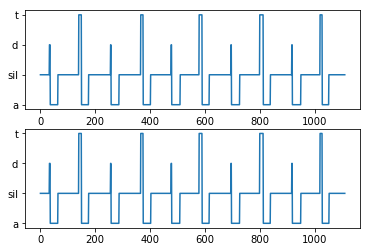

Epoch = 496 / 500 Cost =  0.00845


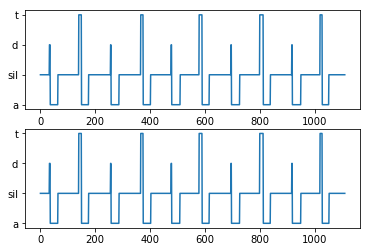

Epoch = 497 / 500 Cost =  0.00842


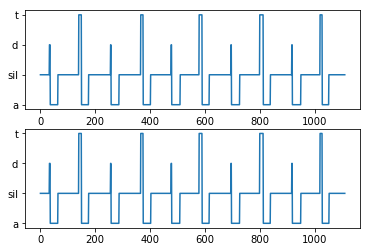

Epoch = 498 / 500 Cost =  0.00840


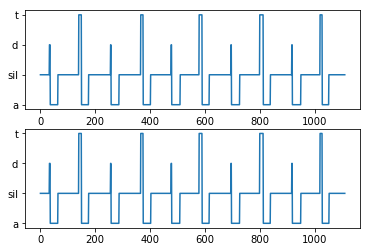

Epoch = 499 / 500 Cost =  0.00837


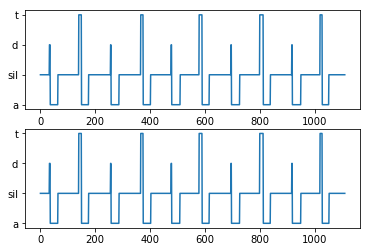

Epoch = 500 / 500 Cost =  0.00834


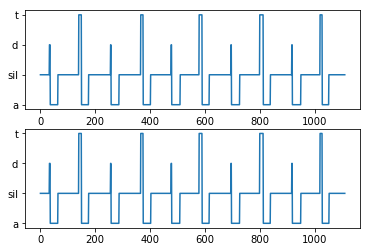

In [6]:
init = tf.global_variables_initializer()
with tf.Session() as sess:
    sess.run(init)
    n'step = 1
    while step <= max_iter:
        loss = 0
        for i in range(n_examples):
            key = 's' + str(i + 1)
            train_x = mfccs.reshape((1, mfccs.shape[0], n_input_dim))
            train_y = words_label.reshape((1, words_label.shape[0], n_output_dim))
            c, _ = sess.run([cost, optimizer], feed_dict={x: train_x, y: train_y})
            loss += c
        mean_mse = loss / n_examples

        print('Epoch =', str(step), '/', str(max_iter),
              'Cost = ', '{:.5f}'.format(mean_mse))
        step += 1
        pred_out = sess.run(pred, feed_dict={x: train_x})
        pred_out = np.argmax(pred_out, 1)

        plt.subplot(211)
        plt.plot(words_data)
        plt.yticks([0, 1, 2, 3], words_list)
        plt.subplot(212)
        plt.plot(pred_out)
        plt.yticks([0, 1, 2, 3], words_list)
        plt.show()

In [ ]:
# Test
with tf.Session() as sess:
    sess.run(init)
    pred_out = sess.run(pred, feed_dict={x: train_x})
    pred_out = np.argmax(pred_out, 1)
    
    plt.subplot(211)
    plt.plot(words_data)
    plt.yticks([0, 1, 2, 3], words_list)
    plt.subplot(212)
    plt.plot(pred_out)
    plt.yticks([0, 1, 2, 3], words_list)
    plt.show()